## Predicting Green Taxi Fares and Total Amounts PART ONE - EDA and CLEANUP
This project aims to predict the fare amounts and total amounts for rides taken with green taxis in New York City. The predictive model will be developed using historical trip data.

### Data Sources
In the initial phase of the project, I conducted research to identify potential data sources. My search led me to an informative article titled "21 Places to Find Free Datasets for Data Science Projects," published by Dataquest and shared on the University of Washington's career blog. This article can be accessed [here](https://careers.uw.edu/blog/2021/10/05/21-places-to-find-free-datasets-for-data-science-projects-shared-article-from-dataquest/).

Following the recommendations from the article, I explored [Data.gov](https://catalog.data.gov/dataset?q=&sort=views_recent+desc), the United States government's open data platform, which offers a wide range of datasets suitable for various data science projects.

### Dataset Selection
For this project, I selected the following dataset, which contains detailed records of green taxi trips in New York City for the year 2020: 2020 Green Taxi Trip Data.
This dataset can be downloaded from the Data.gov website, specifically from the section tagged as 'green taxi data', available at this [link](https://catalog.data.gov/dataset/?tags=green-taxi).

### Columns description
Most detailed description of columns can be found in 2022 Green Taxi Trip Data [landing site](https://data.cityofnewyork.us/Transportation/2022-Green-Taxi-Trip-Data/8nfn-ifaj/about_data).<br>
![Columns description screenshot](./images/columns_description.png)

In [1]:
import pandas as pd
import numpy as np

In [2]:
# Initial data loading from the file
data = pd.read_csv('./2020_Green_Taxi_Trip_Data.csv', low_memory=False)

##  Exploratory Data Analysis

In [3]:
# Initial view at the data
data

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2.0,12/18/2019 03:52:30 PM,12/18/2019 03:54:39 PM,N,1.0,264,264,5.0,0.00,3.50,0.50,0.5,0.01,0.0,NaN,0.3,4.81,1.0,1.0,0.00
1,2.0,01/01/2020 12:45:58 AM,01/01/2020 12:56:39 AM,N,5.0,66,65,2.0,1.28,20.00,0.00,0.0,4.06,0.0,NaN,0.3,24.36,1.0,2.0,0.00
2,2.0,01/01/2020 12:41:38 AM,01/01/2020 12:52:49 AM,N,1.0,181,228,1.0,2.47,10.50,0.50,0.5,3.54,0.0,NaN,0.3,15.34,1.0,1.0,0.00
3,1.0,01/01/2020 12:52:46 AM,01/01/2020 01:14:21 AM,N,1.0,129,263,2.0,6.30,21.00,3.25,0.5,0.00,0.0,NaN,0.3,25.05,2.0,1.0,2.75
4,1.0,01/01/2020 12:19:57 AM,01/01/2020 12:30:56 AM,N,1.0,210,150,1.0,2.30,10.00,0.50,0.5,0.00,0.0,NaN,0.3,11.30,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734046,NaN,12/31/2020 11:02:00 PM,12/31/2020 11:16:00 PM,NaN,NaN,174,168,NaN,7.04,20.33,0.00,0.0,0.00,0.0,NaN,0.3,20.63,NaN,NaN,NaN
1734047,NaN,12/31/2020 11:39:00 PM,12/31/2020 11:54:00 PM,NaN,NaN,256,225,NaN,2.79,13.17,0.00,0.0,0.00,0.0,NaN,0.3,13.47,NaN,NaN,NaN
1734048,NaN,12/31/2020 11:09:00 PM,12/31/2020 11:33:00 PM,NaN,NaN,146,10,NaN,12.41,45.12,0.00,0.0,2.75,0.0,NaN,0.3,48.17,NaN,NaN,NaN
1734049,NaN,12/31/2020 11:01:00 PM,12/31/2020 11:12:00 PM,NaN,NaN,196,28,NaN,4.46,13.96,0.00,0.0,3.13,0.0,NaN,0.3,17.39,NaN,NaN,NaN


In [4]:
initial_rows = data.shape[0]

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1734051 entries, 0 to 1734050
Data columns (total 20 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   VendorID               float64
 1   lpep_pickup_datetime   object 
 2   lpep_dropoff_datetime  object 
 3   store_and_fwd_flag     object 
 4   RatecodeID             float64
 5   PULocationID           int64  
 6   DOLocationID           int64  
 7   passenger_count        float64
 8   trip_distance          float64
 9   fare_amount            float64
 10  extra                  float64
 11  mta_tax                float64
 12  tip_amount             float64
 13  tolls_amount           float64
 14  ehail_fee              float64
 15  improvement_surcharge  float64
 16  total_amount           float64
 17  payment_type           float64
 18  trip_type              float64
 19  congestion_surcharge   float64
dtypes: float64(15), int64(2), object(3)
memory usage: 264.6+ MB


In [6]:
data.isnull().sum()

VendorID                  528092
lpep_pickup_datetime           0
lpep_dropoff_datetime          0
store_and_fwd_flag        528092
RatecodeID                528092
PULocationID                   0
DOLocationID                   0
passenger_count           528092
trip_distance                  0
fare_amount                    0
extra                          0
mta_tax                        0
tip_amount                     0
tolls_amount                   0
ehail_fee                1734051
improvement_surcharge          0
total_amount                   0
payment_type              528092
trip_type                 528097
congestion_surcharge      528092
dtype: int64

In [7]:
data[data.isnull().VendorID]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
19632,NaN,07/02/2020 08:26:00 AM,07/02/2020 09:10:00 AM,NaN,NaN,134,244,NaN,16.00,43.22,0.0,0.0,2.75,6.12,NaN,0.3,52.39,NaN,NaN,NaN
20087,NaN,07/02/2020 08:14:00 AM,07/02/2020 08:55:00 AM,NaN,NaN,205,61,NaN,11.89,49.35,0.0,0.0,2.75,0.00,NaN,0.3,52.40,NaN,NaN,NaN
20270,NaN,07/02/2020 08:11:00 AM,07/02/2020 08:48:00 AM,NaN,NaN,35,231,NaN,7.40,25.93,0.0,0.0,2.75,0.00,NaN,0.3,28.98,NaN,NaN,NaN
20316,NaN,07/02/2020 08:01:00 AM,07/02/2020 08:44:00 AM,NaN,NaN,22,170,NaN,17.10,36.20,0.0,0.0,2.75,6.12,NaN,0.3,45.37,NaN,NaN,NaN
20408,NaN,07/02/2020 08:29:00 AM,07/02/2020 09:00:00 AM,NaN,NaN,72,65,NaN,4.94,20.93,0.0,0.0,2.75,0.00,NaN,0.3,23.98,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734046,NaN,12/31/2020 11:02:00 PM,12/31/2020 11:16:00 PM,NaN,NaN,174,168,NaN,7.04,20.33,0.0,0.0,0.00,0.00,NaN,0.3,20.63,NaN,NaN,NaN
1734047,NaN,12/31/2020 11:39:00 PM,12/31/2020 11:54:00 PM,NaN,NaN,256,225,NaN,2.79,13.17,0.0,0.0,0.00,0.00,NaN,0.3,13.47,NaN,NaN,NaN
1734048,NaN,12/31/2020 11:09:00 PM,12/31/2020 11:33:00 PM,NaN,NaN,146,10,NaN,12.41,45.12,0.0,0.0,2.75,0.00,NaN,0.3,48.17,NaN,NaN,NaN
1734049,NaN,12/31/2020 11:01:00 PM,12/31/2020 11:12:00 PM,NaN,NaN,196,28,NaN,4.46,13.96,0.0,0.0,3.13,0.00,NaN,0.3,17.39,NaN,NaN,NaN


### First conclusions:
It seems that one of the vendors (or type of the vendors) that does not have an ID does not provide certain data, but part of these NaNs are in columns that will not be used for the project.<br>
In columns description above is written that ehail_fee is not used. I will not use it for project as well.

In [8]:
# Pickup and dropoff data caught my attention
np.sort(data['PULocationID'].unique())

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 106, 107,
       108, 109, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
       122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134,
       135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147,
       148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160,
       161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173,
       174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 18

In [9]:
np.sort(data['DOLocationID'].unique())

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 106, 107,
       108, 109, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
       122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134,
       135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147,
       148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160,
       161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173,
       174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 18

### Conclusion
Found data, that are categorical features - that will be the challenge for my project. This data shows pickup and dropoff zones, and there are 265 zones in the city.

In [10]:
# Checking if all zones where used - the answer - yes, there are no zeros
print(data['PULocationID'].value_counts().tolist())
print(data['DOLocationID'].value_counts().tolist())

[144491, 125059, 98037, 70378, 55896, 53352, 49254, 48890, 47966, 46945, 36225, 31764, 29615, 29415, 27544, 26557, 23070, 21832, 21470, 21354, 17647, 15091, 13877, 13721, 13417, 13100, 12556, 12357, 11844, 11835, 11098, 11069, 10431, 10253, 10141, 10134, 9979, 9666, 9475, 9468, 9427, 9400, 8691, 8619, 8510, 8499, 8411, 8379, 8259, 7136, 7116, 6892, 6888, 6761, 6744, 6707, 6643, 6642, 6531, 6028, 5905, 5827, 5661, 5574, 5522, 5489, 5450, 5135, 5134, 5084, 5083, 5043, 4984, 4913, 4886, 4763, 4677, 4629, 4591, 4577, 4501, 4444, 4427, 4091, 4015, 3959, 3866, 3819, 3801, 3721, 3705, 3698, 3695, 3660, 3647, 3621, 3617, 3599, 3585, 3524, 3509, 3404, 3337, 3322, 3260, 3245, 3160, 3151, 3045, 2916, 2881, 2805, 2764, 2580, 2552, 2538, 2537, 2509, 2495, 2411, 2405, 2371, 2323, 2287, 2278, 2234, 2193, 2149, 2077, 2053, 1995, 1995, 1919, 1875, 1849, 1839, 1747, 1721, 1695, 1619, 1600, 1573, 1551, 1527, 1507, 1480, 1467, 1449, 1386, 1366, 1319, 1276, 1225, 1199, 1170, 1166, 1092, 1077, 988, 943, 914

In [11]:
# Checking 'store_and_fwd_flag'
print(data['store_and_fwd_flag'].unique())
print(data['store_and_fwd_flag'].nunique())
print(data['store_and_fwd_flag'].value_counts())

['N' 'Y' nan]
2
store_and_fwd_flag
N    1201260
Y       4699
Name: count, dtype: int64


In [12]:
# Checking 'VendorID'
print(data['VendorID'].unique())
print(data['VendorID'].nunique())
print(data['VendorID'].value_counts())

[ 2.  1. nan]
2
VendorID
2.0    1000743
1.0     205216
Name: count, dtype: int64


In [13]:
# Checking 'passenger_count'
print(data['passenger_count'].unique())
print(data['passenger_count'].nunique())
print(data['passenger_count'].value_counts())

[ 5.  2.  1.  3.  4.  6.  0. nan  7.  8.  9.]
10
passenger_count
1.0    1048934
2.0      81506
5.0      30527
6.0      20440
3.0      15765
4.0       5477
0.0       3198
8.0         57
7.0         44
9.0         11
Name: count, dtype: int64


In [14]:
# Checking 'trip_type'
print(data['trip_type'].unique())
print(data['trip_type'].nunique())
print(data['trip_type'].value_counts())

[ 1.  2. nan]
2
trip_type
1.0    1174243
2.0      31711
Name: count, dtype: int64


In [15]:
# Checking 'RatecodeID'
print(data['RatecodeID'].unique())
print(data['RatecodeID'].nunique())
print(data['RatecodeID'].value_counts())

[ 1.  5.  4.  2.  3. 99. nan  6.]
7
RatecodeID
1.0     1168389
5.0       33853
2.0        2185
4.0         954
3.0         558
6.0          12
99.0          8
Name: count, dtype: int64


In [16]:
# Converting timestamp columns from str to datatime to be able use corr()
data['lpep_pickup_datetime'] = pd.to_datetime(data['lpep_pickup_datetime'], format='%m/%d/%Y %I:%M:%S %p')
data['lpep_dropoff_datetime'] = pd.to_datetime(data['lpep_dropoff_datetime'], format='%m/%d/%Y %I:%M:%S %p')
data

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2.0,2019-12-18 15:52:30,2019-12-18 15:54:39,N,1.0,264,264,5.0,0.00,3.50,0.50,0.5,0.01,0.0,NaN,0.3,4.81,1.0,1.0,0.00
1,2.0,2020-01-01 00:45:58,2020-01-01 00:56:39,N,5.0,66,65,2.0,1.28,20.00,0.00,0.0,4.06,0.0,NaN,0.3,24.36,1.0,2.0,0.00
2,2.0,2020-01-01 00:41:38,2020-01-01 00:52:49,N,1.0,181,228,1.0,2.47,10.50,0.50,0.5,3.54,0.0,NaN,0.3,15.34,1.0,1.0,0.00
3,1.0,2020-01-01 00:52:46,2020-01-01 01:14:21,N,1.0,129,263,2.0,6.30,21.00,3.25,0.5,0.00,0.0,NaN,0.3,25.05,2.0,1.0,2.75
4,1.0,2020-01-01 00:19:57,2020-01-01 00:30:56,N,1.0,210,150,1.0,2.30,10.00,0.50,0.5,0.00,0.0,NaN,0.3,11.30,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734046,NaN,2020-12-31 23:02:00,2020-12-31 23:16:00,NaN,NaN,174,168,NaN,7.04,20.33,0.00,0.0,0.00,0.0,NaN,0.3,20.63,NaN,NaN,NaN
1734047,NaN,2020-12-31 23:39:00,2020-12-31 23:54:00,NaN,NaN,256,225,NaN,2.79,13.17,0.00,0.0,0.00,0.0,NaN,0.3,13.47,NaN,NaN,NaN
1734048,NaN,2020-12-31 23:09:00,2020-12-31 23:33:00,NaN,NaN,146,10,NaN,12.41,45.12,0.00,0.0,2.75,0.0,NaN,0.3,48.17,NaN,NaN,NaN
1734049,NaN,2020-12-31 23:01:00,2020-12-31 23:12:00,NaN,NaN,196,28,NaN,4.46,13.96,0.00,0.0,3.13,0.0,NaN,0.3,17.39,NaN,NaN,NaN


In [17]:
print(data['lpep_pickup_datetime'].dtype)

datetime64[ns]


In [18]:
# Temporarily droping rows with NaNs to be abble change categorical column, and use corr()
temporary_df = data.drop(columns='ehail_fee')
temporary_df = temporary_df.dropna()

# One column 'store_and_fwd_flag' is categorical and 'str' type with two values, converting it to binary format
temporary_df['store_and_fwd_flag'] = pd.get_dummies(temporary_df['store_and_fwd_flag'], drop_first=True).iloc[:, 0]
temporary_df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2.0,2019-12-18 15:52:30,2019-12-18 15:54:39,False,1.0,264,264,5.0,0.00,3.5,0.50,0.5,0.01,0.0,0.3,4.81,1.0,1.0,0.00
1,2.0,2020-01-01 00:45:58,2020-01-01 00:56:39,False,5.0,66,65,2.0,1.28,20.0,0.00,0.0,4.06,0.0,0.3,24.36,1.0,2.0,0.00
2,2.0,2020-01-01 00:41:38,2020-01-01 00:52:49,False,1.0,181,228,1.0,2.47,10.5,0.50,0.5,3.54,0.0,0.3,15.34,1.0,1.0,0.00
3,1.0,2020-01-01 00:52:46,2020-01-01 01:14:21,False,1.0,129,263,2.0,6.30,21.0,3.25,0.5,0.00,0.0,0.3,25.05,2.0,1.0,2.75
4,1.0,2020-01-01 00:19:57,2020-01-01 00:30:56,False,1.0,210,150,1.0,2.30,10.0,0.50,0.5,0.00,0.0,0.3,11.30,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1697344,2.0,2020-12-31 23:08:35,2020-12-31 23:13:00,False,1.0,41,74,1.0,0.79,5.0,0.50,0.5,0.00,0.0,0.3,6.30,2.0,1.0,0.00
1697345,2.0,2020-12-31 23:11:04,2020-12-31 23:20:08,False,5.0,41,116,2.0,2.31,12.0,0.00,0.0,0.00,0.0,0.3,12.30,2.0,2.0,0.00
1697346,2.0,2020-12-31 23:24:33,2020-12-31 23:40:24,False,5.0,116,119,1.0,5.73,20.0,0.00,0.0,0.00,0.0,0.3,20.30,2.0,2.0,0.00
1697347,2.0,2020-12-31 23:13:59,2020-12-31 23:16:20,False,1.0,42,42,1.0,0.31,3.5,0.50,0.5,0.00,0.0,0.3,4.80,2.0,1.0,0.00


In [19]:
# Checking if peek hour or night surcharges are applied - adding two columns
def is_night_surcharge(pickup_time):
    # Checking if the pickup time is between 8 PM and 6 AM
    return 1 if pickup_time.hour >= 20 or pickup_time.hour < 6 else 0

def is_peak_hour_surcharge(pickup_time):
    # Checking if the pickup time is between 4 PM and 8 PM on weekdays
    return 1 if pickup_time.weekday() < 5 and 16 <= pickup_time.hour < 20 else 0

temporary_df['night'] = temporary_df['lpep_pickup_datetime'].apply(is_night_surcharge)
temporary_df['peak_hour'] = temporary_df['lpep_pickup_datetime'].apply(is_peak_hour_surcharge)

In [20]:
# Adding congestion
temporary_df['congestion'] = np.where(temporary_df['congestion_surcharge'] > 2, 1, 0)

In [21]:
temporary_df.columns

Index(['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime',
       'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID',
       'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount',
       'payment_type', 'trip_type', 'congestion_surcharge', 'night',
       'peak_hour', 'congestion'],
      dtype='object')

In [22]:
temporary_df.sample(n=20)[['fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount',
       'payment_type', 'trip_type', 'congestion_surcharge', 'night',
       'peak_hour', 'congestion']]

,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,night,peak_hour,congestion
74071,3.5,0.00,0.5,0.86,0.0,0.3,5.16,1.0,1.0,0.00,0,0,0
864709,10.0,1.00,0.5,2.91,0.0,0.3,17.46,1.0,1.0,2.75,0,1,1
1570509,12.0,0.50,0.5,0.00,0.0,0.3,13.30,2.0,1.0,0.00,1,0,0
1087810,44.5,0.00,0.5,0.00,0.0,0.3,45.30,2.0,1.0,0.00,0,0,0
449247,-3.0,-0.50,-0.5,0.00,0.0,-0.3,-4.30,3.0,1.0,0.00,1,0,0
691635,8.0,0.00,0.5,0.00,0.0,0.3,8.80,2.0,1.0,0.00,0,0,0
983767,5.5,0.00,0.5,1.26,0.0,0.3,7.56,1.0,1.0,0.00,0,0,0
626896,12.0,2.75,0.5,3.10,0.0,0.3,18.65,1.0,1.0,2.75,0,0,1
950345,7.0,0.50,0.5,0.00,0.0,0.3,8.30,2.0,1.0,0.00,1,0,0
65192,9.0,1.00,0.5,2.16,0.0,0.3,12.96,1.0,1.0,0.00,0,1,0


In [23]:
print(temporary_df['congestion_surcharge'].value_counts())

congestion_surcharge
 0.00    993521
 2.75    211706
 2.50       709
-2.75        11
 0.75         7
Name: count, dtype: int64


In [24]:
print(temporary_df['store_and_fwd_flag'].value_counts())

store_and_fwd_flag
False    1201259
True        4695
Name: count, dtype: int64


In [25]:
corr = temporary_df.corr()
corr

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,night,peak_hour,congestion
VendorID,1.000000,-0.011426,-0.011406,-0.138058,-0.005534,-0.021795,0.004735,0.090423,0.002810,-0.011592,...,0.047431,0.002204,0.051462,0.002752,-0.005087,-0.011086,0.025903,0.034231,0.013516,0.025816
lpep_pickup_datetime,-0.011426,1.000000,0.999995,0.027846,0.027930,-0.034359,0.002922,-0.011984,0.003482,0.077732,...,0.018142,0.051623,0.003033,0.076045,-0.008575,0.019487,0.031870,-0.116641,-0.001628,0.031943
lpep_dropoff_datetime,-0.011406,0.999995,1.000000,0.027843,0.027933,-0.034349,0.002933,-0.011978,0.003486,0.077809,...,0.018159,0.051658,0.003036,0.076120,-0.008589,0.019486,0.031884,-0.116644,-0.001631,0.031956
store_and_fwd_flag,-0.138058,0.027846,0.027843,1.000000,0.005271,0.003223,0.008870,-0.013610,-0.000448,-0.001307,...,-0.012967,-0.001930,-0.023705,-0.004187,0.020578,0.000711,-0.003387,-0.009843,-0.001328,-0.003390
RatecodeID,-0.005534,0.027930,0.027933,0.005271,1.000000,0.082251,0.044028,-0.004505,0.010796,0.107464,...,0.006134,0.024754,-0.246721,0.082371,0.029681,0.890976,-0.060394,0.033664,-0.024034,-0.060385
PULocationID,-0.021795,-0.034359,-0.034349,0.003223,0.082251,1.000000,0.169056,0.000847,0.003015,0.112830,...,0.030914,0.053795,-0.041356,0.106655,-0.019358,0.079612,-0.032029,0.044785,-0.003617,-0.032040
DOLocationID,0.004735,0.002922,0.002933,0.008870,0.044028,0.169056,1.000000,0.008547,0.002380,0.104011,...,0.093265,0.021005,-0.005188,0.136322,-0.080836,0.039453,0.327807,-0.002345,-0.003893,0.327802
passenger_count,0.090423,-0.011984,-0.011978,-0.013610,-0.004505,0.000847,0.008547,1.000000,-0.000778,-0.022428,...,0.002540,-0.012583,0.005940,-0.018634,0.016332,-0.002760,0.016670,-0.002357,0.009540,0.016625
trip_distance,0.002810,0.003482,0.003486,-0.000448,0.010796,0.003015,0.002380,-0.000778,1.000000,0.019705,...,0.004756,0.010468,0.000834,0.019259,-0.000887,-0.000312,0.003082,-0.000212,-0.001445,0.003080
fare_amount,-0.011592,0.077732,0.077809,-0.001307,0.107464,0.112830,0.104011,-0.022428,0.019705,1.000000,...,0.236487,0.452428,0.089538,0.972747,-0.176652,0.074192,0.145564,-0.025868,-0.018695,0.145565


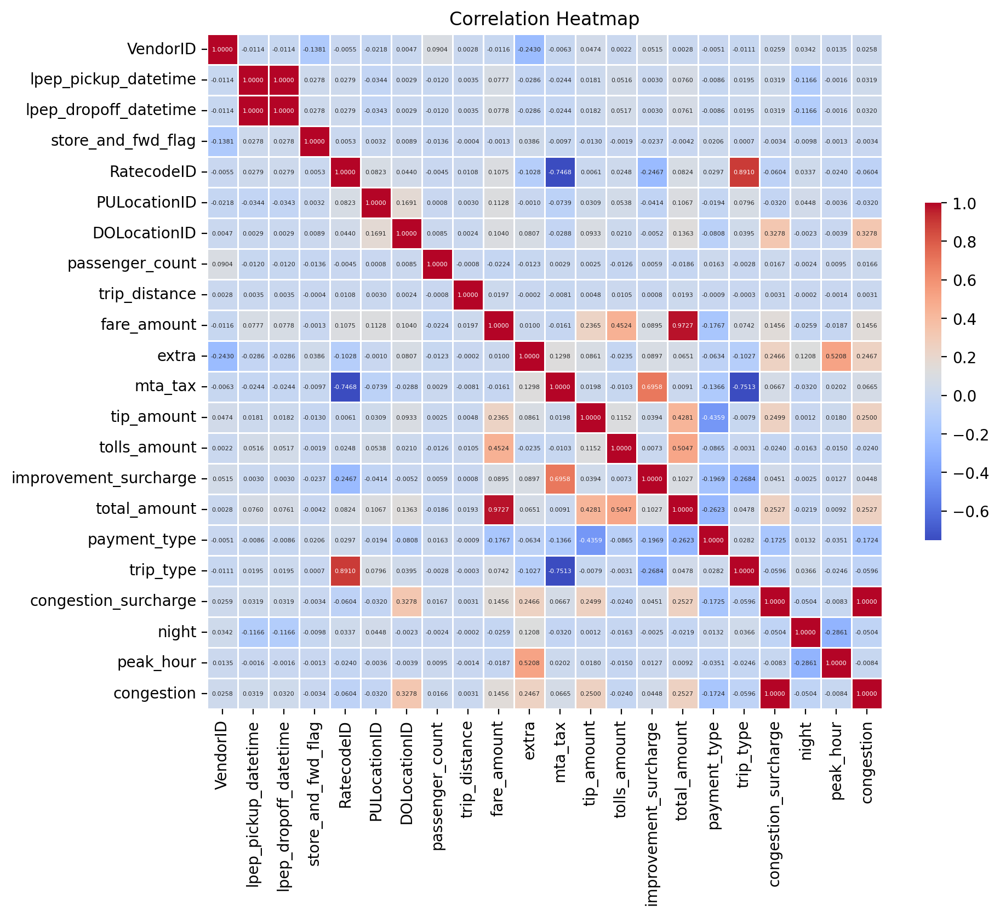

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8), dpi=200)
sns.heatmap(corr, annot=True, fmt=".4f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"size": 4})
plt.title('Correlation Heatmap')
plt.show()


In [27]:
temporary_df.groupby('RatecodeID')['fare_amount'].describe()

,count,mean,std,min,25%,50%,75%,max
RatecodeID,,,,,,,,
1.0,1168389.0,12.407849,10.777414,-49.0,6.5,9.00,14.5,803.0
2.0,2185.0,47.882838,19.945002,-52.0,52.0,52.00,52.0,52.0
3.0,558.0,47.617384,33.775637,-21.5,20.0,30.25,80.5,137.5
4.0,954.0,59.226939,45.991127,-5.5,33.0,48.25,73.5,630.0
5.0,33853.0,18.450046,20.660267,-210.0,8.7,13.00,22.0,500.0
6.0,12.0,2.583333,0.288675,2.5,2.5,2.50,2.5,3.5
99.0,3.0,2.500000,0.000000,2.5,2.5,2.50,2.5,2.5


In [28]:
temporary_df.groupby('RatecodeID')['total_amount'].describe()

,count,mean,std,min,25%,50%,75%,max
RatecodeID,,,,,,,,
1.0,1168389.0,15.433665,1.235305e+01,-50.80,8.30,11.800,18.30,803.80
2.0,2185.0,57.742050,2.391626e+01,-65.31,52.80,58.920,70.70,117.84
3.0,558.0,60.329659,4.617735e+01,-21.80,20.30,36.335,103.86,164.42
4.0,954.0,66.378491,5.057815e+01,-6.30,37.62,52.830,80.80,636.92
5.0,33853.0,20.233492,2.245503e+01,-210.30,9.96,14.300,24.36,500.30
6.0,12.0,3.800000,1.445998e+00,3.30,3.30,3.300,3.30,8.30
99.0,3.0,3.800000,5.438960e-16,3.80,3.80,3.800,3.80,3.80


In [29]:
# It seems that passenger count does not really matter
temporary_df.groupby('passenger_count')['total_amount'].describe()

,count,mean,std,min,25%,50%,75%,max
passenger_count,,,,,,,,
0.0,3193.0,13.642750,11.025000,-210.3,7.80,11.16,16.80,210.30
1.0,1048934.0,15.736181,13.105820,-200.3,8.30,11.80,18.55,803.80
2.0,81506.0,16.324449,14.428551,-70.0,8.30,12.05,18.80,636.92
3.0,15765.0,15.739990,14.198621,-52.8,8.30,11.63,18.05,400.30
4.0,5477.0,15.248187,13.748715,-52.8,7.80,11.30,17.80,400.30
5.0,30527.0,14.551431,12.019578,-85.3,8.19,11.30,17.30,500.30
6.0,20440.0,13.832267,10.050414,-65.3,7.80,11.00,16.80,458.80
7.0,44.0,21.520000,33.877125,3.3,7.30,8.76,8.85,175.30
8.0,57.0,12.735614,18.781909,8.3,8.30,9.30,9.96,125.00


### Simplifying dataframe
Taking for the project only data (columns) that will be used for the project in that way simplifying dataframe for further exploration.

In [30]:
# Dropping vendor, passengers, and ehail fee
project_data_20 = data[['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'RatecodeID', 'PULocationID', 'DOLocationID', 'trip_distance', 'fare_amount',
                        'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'payment_type',
                        'trip_type', 'congestion_surcharge']]
project_data_20

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2019-12-18 15:52:30,2019-12-18 15:54:39,1.0,264,264,0.00,3.50,0.50,0.5,0.01,0.0,0.3,4.81,1.0,1.0,0.00
1,2020-01-01 00:45:58,2020-01-01 00:56:39,5.0,66,65,1.28,20.00,0.00,0.0,4.06,0.0,0.3,24.36,1.0,2.0,0.00
2,2020-01-01 00:41:38,2020-01-01 00:52:49,1.0,181,228,2.47,10.50,0.50,0.5,3.54,0.0,0.3,15.34,1.0,1.0,0.00
3,2020-01-01 00:52:46,2020-01-01 01:14:21,1.0,129,263,6.30,21.00,3.25,0.5,0.00,0.0,0.3,25.05,2.0,1.0,2.75
4,2020-01-01 00:19:57,2020-01-01 00:30:56,1.0,210,150,2.30,10.00,0.50,0.5,0.00,0.0,0.3,11.30,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734046,2020-12-31 23:02:00,2020-12-31 23:16:00,NaN,174,168,7.04,20.33,0.00,0.0,0.00,0.0,0.3,20.63,NaN,NaN,NaN
1734047,2020-12-31 23:39:00,2020-12-31 23:54:00,NaN,256,225,2.79,13.17,0.00,0.0,0.00,0.0,0.3,13.47,NaN,NaN,NaN
1734048,2020-12-31 23:09:00,2020-12-31 23:33:00,NaN,146,10,12.41,45.12,0.00,0.0,2.75,0.0,0.3,48.17,NaN,NaN,NaN
1734049,2020-12-31 23:01:00,2020-12-31 23:12:00,NaN,196,28,4.46,13.96,0.00,0.0,3.13,0.0,0.3,17.39,NaN,NaN,NaN


### Working on NaNs
528092 rows of 1734051 total rows has NaNs - 30 %, shoud try to fill data.

In [31]:
project_data_20

,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2019-12-18 15:52:30,2019-12-18 15:54:39,1.0,264,264,0.00,3.50,0.50,0.5,0.01,0.0,0.3,4.81,1.0,1.0,0.00
1,2020-01-01 00:45:58,2020-01-01 00:56:39,5.0,66,65,1.28,20.00,0.00,0.0,4.06,0.0,0.3,24.36,1.0,2.0,0.00
2,2020-01-01 00:41:38,2020-01-01 00:52:49,1.0,181,228,2.47,10.50,0.50,0.5,3.54,0.0,0.3,15.34,1.0,1.0,0.00
3,2020-01-01 00:52:46,2020-01-01 01:14:21,1.0,129,263,6.30,21.00,3.25,0.5,0.00,0.0,0.3,25.05,2.0,1.0,2.75
4,2020-01-01 00:19:57,2020-01-01 00:30:56,1.0,210,150,2.30,10.00,0.50,0.5,0.00,0.0,0.3,11.30,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734046,2020-12-31 23:02:00,2020-12-31 23:16:00,NaN,174,168,7.04,20.33,0.00,0.0,0.00,0.0,0.3,20.63,NaN,NaN,NaN
1734047,2020-12-31 23:39:00,2020-12-31 23:54:00,NaN,256,225,2.79,13.17,0.00,0.0,0.00,0.0,0.3,13.47,NaN,NaN,NaN
1734048,2020-12-31 23:09:00,2020-12-31 23:33:00,NaN,146,10,12.41,45.12,0.00,0.0,2.75,0.0,0.3,48.17,NaN,NaN,NaN
1734049,2020-12-31 23:01:00,2020-12-31 23:12:00,NaN,196,28,4.46,13.96,0.00,0.0,3.13,0.0,0.3,17.39,NaN,NaN,NaN


## Feature engineering

In [32]:
# Adding colum with trip duration
project_data_20['trip_duration'] = (project_data_20['lpep_dropoff_datetime'] - project_data_20['lpep_pickup_datetime']).dt.total_seconds()

C:\Users\tomui\AppData\Local\Temp\ipykernel_22436\2485309438.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_data_20['trip_duration'] = (project_data_20['lpep_dropoff_datetime'] - project_data_20['lpep_pickup_datetime']).dt.total_seconds()


In [33]:
# Adding peek time and night columns - they correlate with total amount
def is_night_surcharge(pickup_time):
    # Checking if the pickup time is between 8 PM and 6 AM
    return 1 if pickup_time.hour >= 20 or pickup_time.hour < 6 else 0

def is_peak_hour_surcharge(pickup_time):
    # Checking if the pickup time is between 4 PM and 8 PM on weekdays
    return 1 if pickup_time.weekday() < 5 and 16 <= pickup_time.hour < 20 else 0

project_data_20['night'] = project_data_20['lpep_pickup_datetime'].apply(is_night_surcharge)
project_data_20['peak_hour'] = project_data_20['lpep_pickup_datetime'].apply(is_peak_hour_surcharge)

# Adding congestion
project_data_20['congestion'] = np.where(project_data_20['congestion_surcharge'] > 2, 1, 0)

C:\Users\tomui\AppData\Local\Temp\ipykernel_22436\3684049516.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_data_20['night'] = project_data_20['lpep_pickup_datetime'].apply(is_night_surcharge)
C:\Users\tomui\AppData\Local\Temp\ipykernel_22436\3684049516.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_data_20['peak_hour'] = project_data_20['lpep_pickup_datetime'].apply(is_peak_hour_surcharge)


In [34]:
# Subtracting tip amount from total amount, because data is inaccurate due to the type of payment
project_data_20['amount_without_tip'] = project_data_20['total_amount'] - project_data_20['tip_amount']

In [35]:
project_data_20.columns

Index(['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'RatecodeID',
       'PULocationID', 'DOLocationID', 'trip_distance', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'payment_type', 'trip_type', 'congestion_surcharge',
       'trip_duration', 'night', 'peak_hour', 'congestion',
       'amount_without_tip'],
      dtype='object')

### Here I have returned from my notebook for models and dropped all rows with NaNs

In [36]:
project_data_20.dropna(inplace=True)

## Simplifying dataframe 2
I observed that the correlation between the fare and the columns 'RatecodeID', 'payment_type', and 'trip_type' is minimal. At first there was a chance that the NaNs could be filled in easily, hoped that they would be consistent, but further analysis revealed that the data in the other columns was not consistent enough to identify missing values.

In [37]:
project_data_20 = project_data_20[['lpep_pickup_datetime', 'lpep_dropoff_datetime', 
       'PULocationID', 'DOLocationID', 'trip_distance', 'fare_amount', 
       'total_amount', 'trip_duration', 'night', 'peak_hour', 'congestion',
       'amount_without_tip']]
project_data_20

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip
0,2019-12-18 15:52:30,2019-12-18 15:54:39,264,264,0.00,3.5,4.81,129.0,0,0,0,4.80
1,2020-01-01 00:45:58,2020-01-01 00:56:39,66,65,1.28,20.0,24.36,641.0,1,0,0,20.30
2,2020-01-01 00:41:38,2020-01-01 00:52:49,181,228,2.47,10.5,15.34,671.0,1,0,0,11.80
3,2020-01-01 00:52:46,2020-01-01 01:14:21,129,263,6.30,21.0,25.05,1295.0,1,0,1,25.05
4,2020-01-01 00:19:57,2020-01-01 00:30:56,210,150,2.30,10.0,11.30,659.0,1,0,0,11.30
...,...,...,...,...,...,...,...,...,...,...,...,...
1697344,2020-12-31 23:08:35,2020-12-31 23:13:00,41,74,0.79,5.0,6.30,265.0,1,0,0,6.30
1697345,2020-12-31 23:11:04,2020-12-31 23:20:08,41,116,2.31,12.0,12.30,544.0,1,0,0,12.30
1697346,2020-12-31 23:24:33,2020-12-31 23:40:24,116,119,5.73,20.0,20.30,951.0,1,0,0,20.30
1697347,2020-12-31 23:13:59,2020-12-31 23:16:20,42,42,0.31,3.5,4.80,141.0,1,0,0,4.80


## Visualisation of the data

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


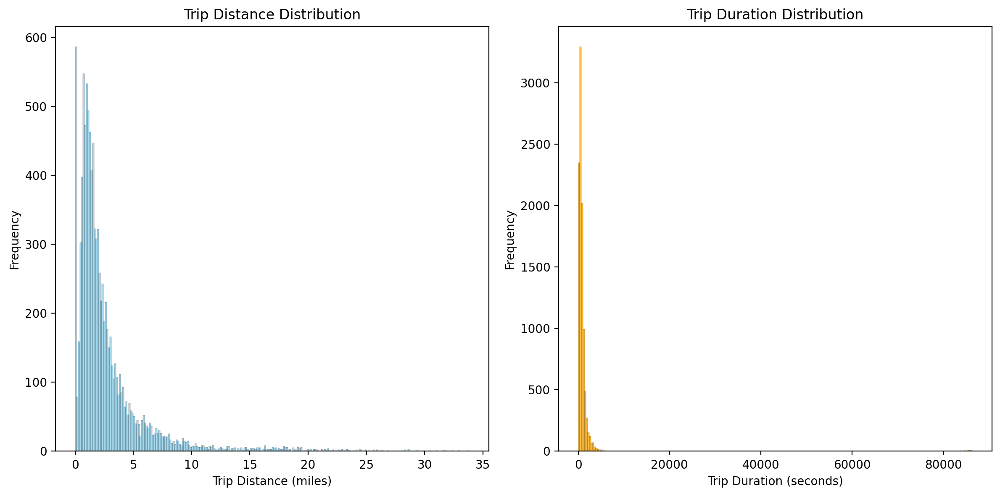

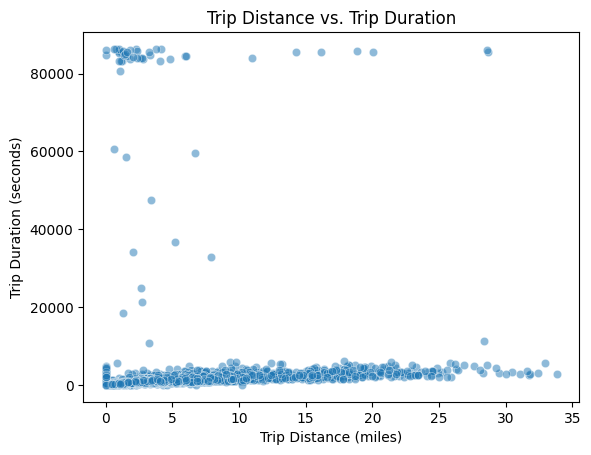

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Taking a random sample of 10,000 rows from the DataFrame
sample_data = project_data_20.sample(n=10000, random_state=1)
#sample_data = project_data_20.sample(n=5000, random_state=1)

plt.figure(figsize=(12, 6), dpi=200)

# Histogram for 'trip_distance'
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
sns.histplot(sample_data['trip_distance'], kde=False, bins=250, color='skyblue')
plt.title('Trip Distance Distribution')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Frequency')

# Histogram for 'trip_duration'
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
sns.histplot(sample_data['trip_duration'], kde=False, bins=250, color='orange')
plt.title('Trip Duration Distribution')
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Creating a scatter plot for 'trip_distance' vs. 'trip_duration'
sns.scatterplot(data=sample_data, x='trip_distance', y='trip_duration', alpha=0.5)

plt.title('Trip Distance vs. Trip Duration')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (seconds)')
plt.show()

C:\Users\tomui\AppData\Local\Temp\ipykernel_22436\3917539630.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_data_20['distance_bin'] = pd.cut(project_data_20['trip_distance'], bins=distance_bins, labels=distance_labels, right=False)
C:\Users\tomui\AppData\Local\Temp\ipykernel_22436\3917539630.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  project_data_20['time_bin'] = pd.cut(project_data_20['trip_duration'], bins=time_bins, labels=time_labels, right=False)
C:\Users\tomui\anaconda3\Lib\sit

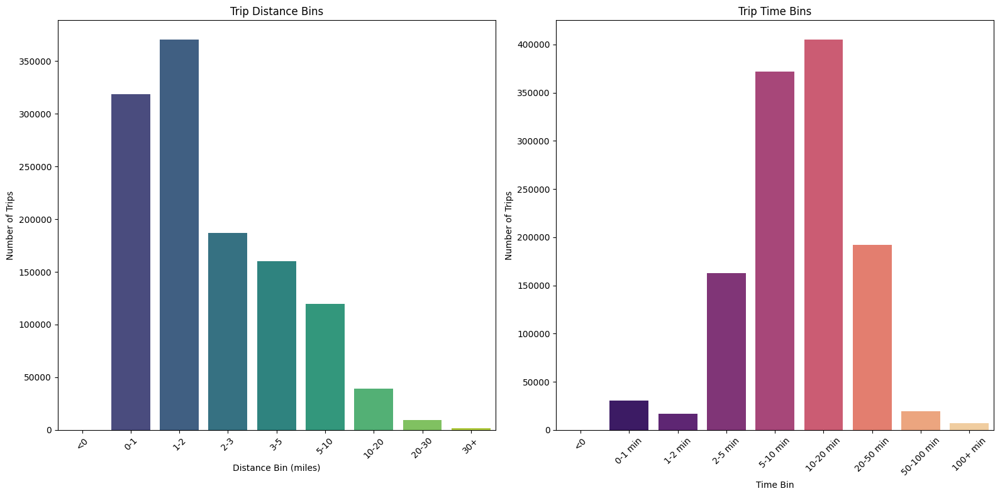

In [39]:
# Defining bins for trip distances
distance_bins = [-np.inf, 0, 1, 2, 3, 5, 10, 20, 30, np.inf]
distance_labels = ['<0', '0-1', '1-2', '2-3', '3-5', '5-10', '10-20', '20-30', '30+']

# Defining bins for trip times (in seconds)
time_bins = [-np.inf, 0, 60, 120, 300, 600, 1200, 3000, 6000, np.inf]
time_labels = ['<0', '0-1 min', '1-2 min', '2-5 min', '5-10 min', '10-20 min', '20-50 min', '50-100 min', '100+ min']

# Bin the trip distance data
project_data_20['distance_bin'] = pd.cut(project_data_20['trip_distance'], bins=distance_bins, labels=distance_labels, right=False)

# Bin the trip time data
project_data_20['time_bin'] = pd.cut(project_data_20['trip_duration'], bins=time_bins, labels=time_labels, right=False)

# Set the figure size
plt.figure(figsize=(16, 8))

# Plot for binned trip distances
plt.subplot(1, 2, 1)
sns.countplot(x='distance_bin', data=project_data_20, palette='viridis')
plt.title('Trip Distance Bins')
plt.xlabel('Distance Bin (miles)')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

# Plot for binned trip times
plt.subplot(1, 2, 2)
sns.countplot(x='time_bin', data=project_data_20, palette='magma')
plt.title('Trip Time Bins')
plt.xlabel('Time Bin')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [40]:
project_data_20[project_data_20['trip_duration'] > 6000]

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin
85,2020-01-01 00:38:30,2020-01-01 23:25:23,243,244,0.93,5.5,8.16,82013.0,1,0,0,6.80,0-1,100+ min
447,2020-01-01 00:29:15,2020-01-01 23:59:23,181,68,5.66,22.5,26.55,84608.0,1,0,1,26.55,5-10,100+ min
474,2020-01-01 00:10:33,2020-01-01 21:46:10,112,226,2.87,12.0,13.30,77737.0,1,0,0,13.30,2-3,100+ min
671,2020-01-01 00:33:09,2020-01-02 00:00:00,40,97,1.87,22.0,23.30,84411.0,1,0,0,23.30,1-2,100+ min
1026,2019-12-31 20:27:53,2020-01-01 19:45:52,223,130,10.19,29.5,36.96,83879.0,1,0,0,30.80,10-20,100+ min
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1696626,2020-12-31 14:59:16,2020-12-31 19:31:47,55,55,40.68,188.0,200.00,16351.0,0,0,0,188.80,30+,100+ min
1696688,2020-12-31 14:41:30,2021-01-01 13:49:19,74,42,1.45,7.5,8.30,83269.0,0,0,0,8.30,1-2,100+ min
1696784,2020-12-31 16:44:34,2020-12-31 18:24:47,60,136,12.81,65.0,69.55,6013.0,0,1,0,66.80,10-20,100+ min
1697085,2020-12-31 16:41:12,2021-01-01 16:00:07,75,224,5.60,19.5,21.30,83935.0,0,1,0,21.30,5-10,100+ min


## Data Cleansing
The visualizations have highlighted apparent issues with the data, including negative and zero values, excessively long distances, and durations that are unrealistically extended. To address these anomalies, I plan to cleanse the data by removing such erroneous entries and then reapply the visualization process for a more accurate representation.

In [41]:
# Removing rows with negative and zero trip distances
project_data_20 = project_data_20[project_data_20['trip_distance'] > 0]

# Removing rows with negative and zero trip durations
project_data_20 = project_data_20[project_data_20['trip_duration'] > 0]

# Removing rows with negative and zero fare amounts
project_data_20 = project_data_20[project_data_20['fare_amount'] > 0]

# Removing rows with negative and zero total amounts
project_data_20 = project_data_20[project_data_20['total_amount'] > 0]

# Removing rows where trip duration exceeds 12000 seconds
project_data_20 = project_data_20[project_data_20['trip_duration'] <= 12000]

# Removing rows where trip distance exceeds 40 miles
project_data_20 = project_data_20[project_data_20['trip_distance'] <= 40]

project_data_20

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin
1,2020-01-01 00:45:58,2020-01-01 00:56:39,66,65,1.28,20.0,24.36,641.0,1,0,0,20.30,1-2,10-20 min
2,2020-01-01 00:41:38,2020-01-01 00:52:49,181,228,2.47,10.5,15.34,671.0,1,0,0,11.80,2-3,10-20 min
3,2020-01-01 00:52:46,2020-01-01 01:14:21,129,263,6.30,21.0,25.05,1295.0,1,0,1,25.05,5-10,20-50 min
4,2020-01-01 00:19:57,2020-01-01 00:30:56,210,150,2.30,10.0,11.30,659.0,1,0,0,11.30,2-3,10-20 min
5,2020-01-01 00:52:33,2020-01-01 01:09:54,35,39,3.00,13.5,14.80,1041.0,1,0,0,14.80,3-5,10-20 min
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1697344,2020-12-31 23:08:35,2020-12-31 23:13:00,41,74,0.79,5.0,6.30,265.0,1,0,0,6.30,0-1,2-5 min
1697345,2020-12-31 23:11:04,2020-12-31 23:20:08,41,116,2.31,12.0,12.30,544.0,1,0,0,12.30,2-3,5-10 min
1697346,2020-12-31 23:24:33,2020-12-31 23:40:24,116,119,5.73,20.0,20.30,951.0,1,0,0,20.30,5-10,10-20 min
1697347,2020-12-31 23:13:59,2020-12-31 23:16:20,42,42,0.31,3.5,4.80,141.0,1,0,0,4.80,0-1,2-5 min


C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


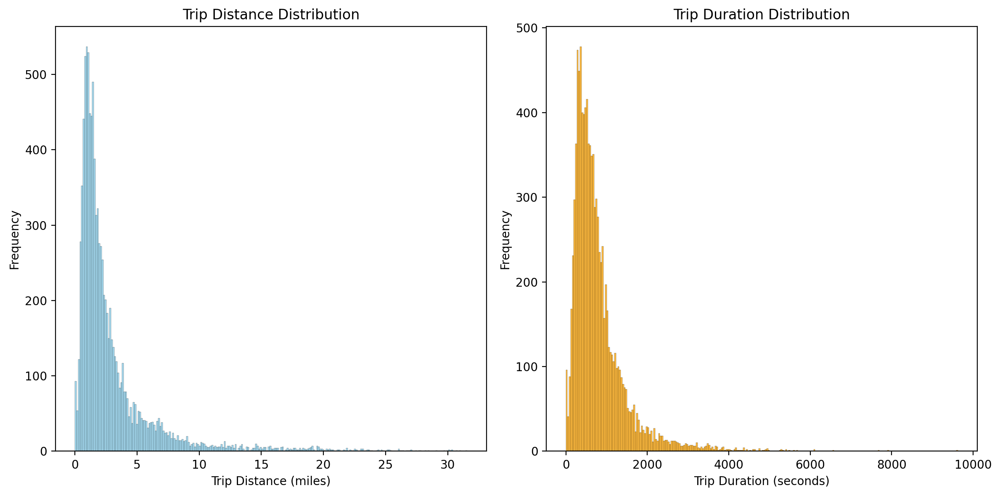

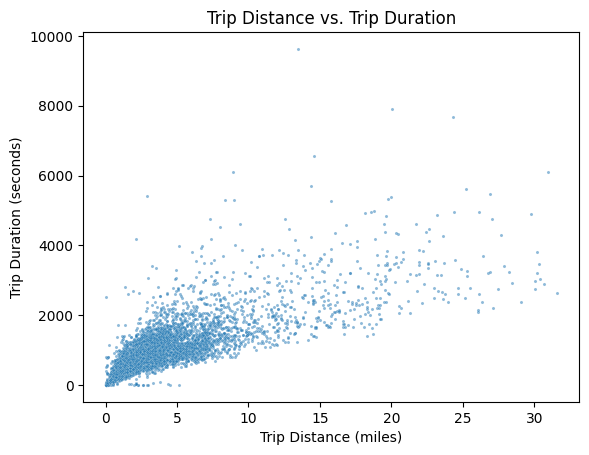

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


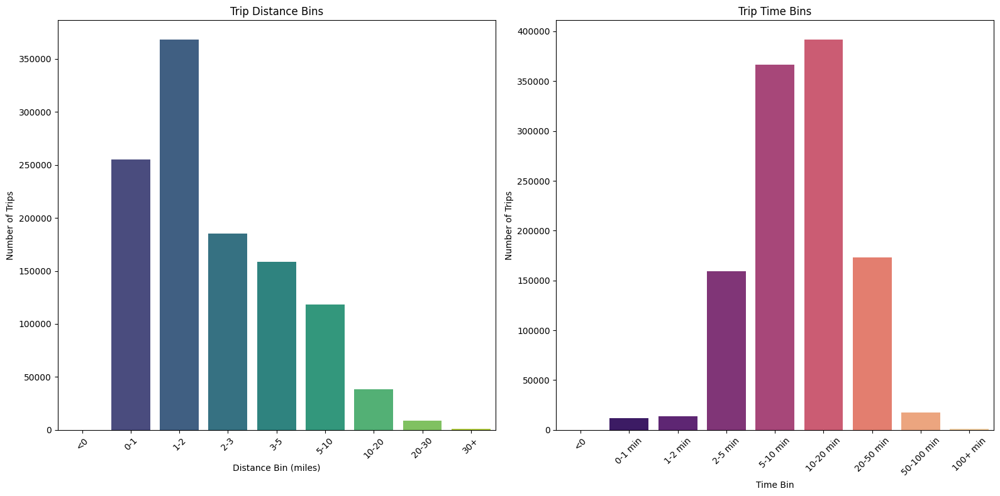

In [42]:
# Taking a random sample of 10,000 rows from the DataFrame
sample_data = project_data_20.sample(n=10000, random_state=1)
#sample_data = project_data_20.sample(n=5000, random_state=1)

plt.figure(figsize=(12, 6), dpi=200)

# Histogram for 'trip_distance'
plt.subplot(1, 2, 1)
sns.histplot(sample_data['trip_distance'], kde=False, bins=250, color='skyblue')
plt.title('Trip Distance Distribution')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Frequency')

# Histogram for 'trip_duration'
plt.subplot(1, 2, 2)
sns.histplot(sample_data['trip_duration'], kde=False, bins=250, color='orange')
plt.title('Trip Duration Distribution')
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Creating a scatter plot for 'trip_distance' vs. 'trip_duration'
sns.scatterplot(data=sample_data, x='trip_distance', y='trip_duration', alpha=0.5, s=5)

plt.title('Trip Distance vs. Trip Duration')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (seconds)')
plt.show()

# Defining bins for trip distances
distance_bins = [-np.inf, 0, 1, 2, 3, 5, 10, 20, 30, np.inf]
distance_labels = ['<0', '0-1', '1-2', '2-3', '3-5', '5-10', '10-20', '20-30', '30+']

# Defining bins for trip times (in seconds)
time_bins = [-np.inf, 0, 60, 120, 300, 600, 1200, 3000, 6000, np.inf]
time_labels = ['<0', '0-1 min', '1-2 min', '2-5 min', '5-10 min', '10-20 min', '20-50 min', '50-100 min', '100+ min']

project_data_20.drop(columns=['distance_bin', 'time_bin' ], inplace=True)
# Bin the trip distance data
project_data_20['distance_bin'] = pd.cut(project_data_20['trip_distance'], bins=distance_bins, labels=distance_labels, right=False)

# Bin the trip time data
project_data_20['time_bin'] = pd.cut(project_data_20['trip_duration'], bins=time_bins, labels=time_labels, right=False)

# Set the figure size
plt.figure(figsize=(16, 8))

# Plot for binned trip distances
plt.subplot(1, 2, 1)
sns.countplot(x='distance_bin', data=project_data_20, palette='viridis')
plt.title('Trip Distance Bins')
plt.xlabel('Distance Bin (miles)')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

# Plot for binned trip times
plt.subplot(1, 2, 2)
sns.countplot(x='time_bin', data=project_data_20, palette='magma')
plt.title('Trip Time Bins')
plt.xlabel('Time Bin')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [43]:
print(f"tdist < 0 : {len(project_data_20[project_data_20.trip_distance < 0])}")
print(f"tdur < 0 : {len(project_data_20[project_data_20.trip_duration < 0])}")
print(f"tdist < 0.1 : {len(project_data_20[project_data_20.trip_distance < 0.1])}")
print(f"tdist 0.1 - 0.2 : {len(project_data_20[(project_data_20.trip_distance > 0.1) & (project_data_20.trip_distance < 0.2)])}")
print(f"tdur < 10 sec.: {len(project_data_20[project_data_20.trip_duration < 10])}")
print(f"tdur < 0.5 min.: {len(project_data_20[project_data_20.trip_duration < 30])}")
print(f"tdist > 30 miles : {len(project_data_20[project_data_20.trip_distance > 30])}")
print(f"tdur > 2 h : {len(project_data_20[project_data_20.trip_duration > 7200])}")

tdist < 0 : 0
tdur < 0 : 0
tdist < 0.1 : 7811
tdist 0.1 - 0.2 : 3995
tdur < 10 sec.: 3555
tdur < 0.5 min.: 7706
tdist > 30 miles : 1258
tdur > 2 h : 460


## Removing Outliers
There appears to be a significant number of trips with negligible distances yet prolonged durations, which I suspect are due to equipment malfunctions or unsuccessful trips. Such instances are not relevant to my model's objectives. Therefore, I plan to exclude these outliers from my dataset.

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


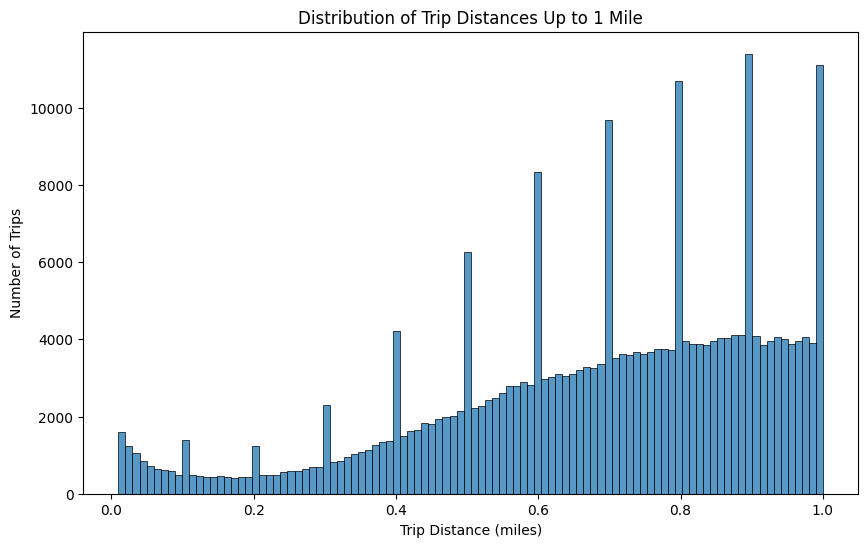

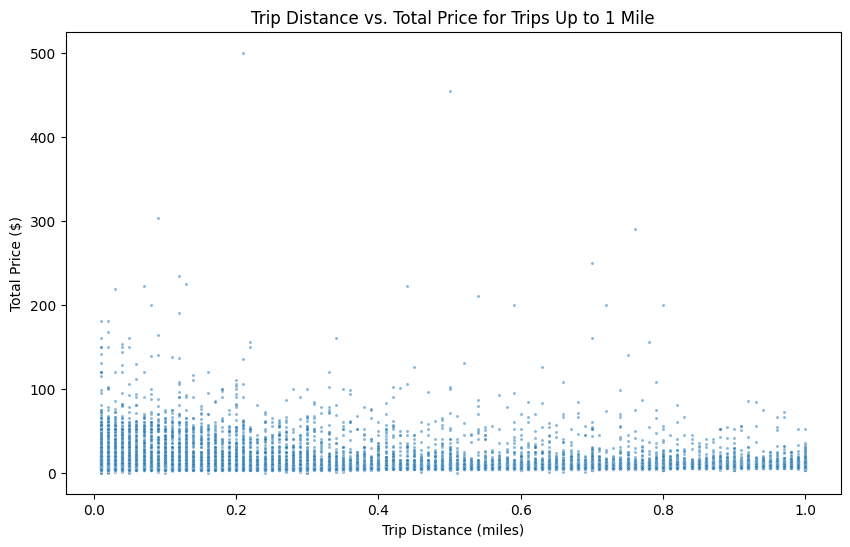

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


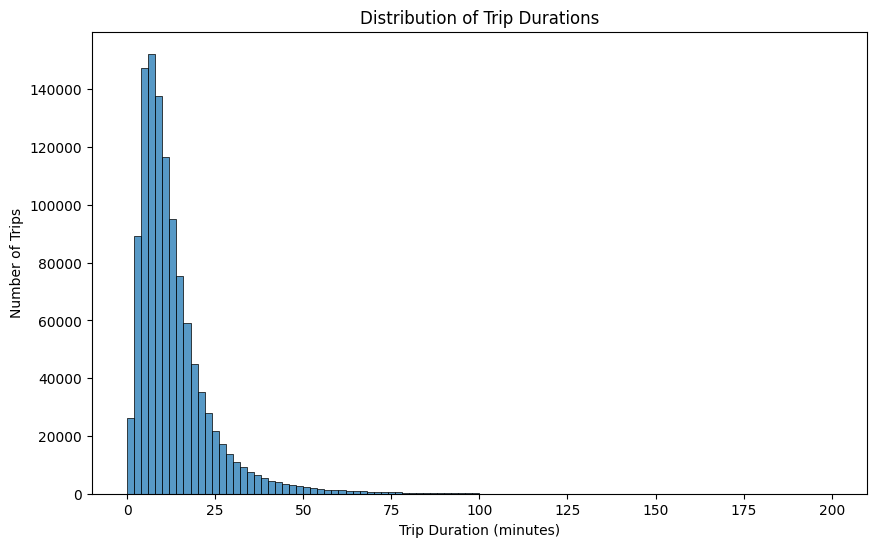

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


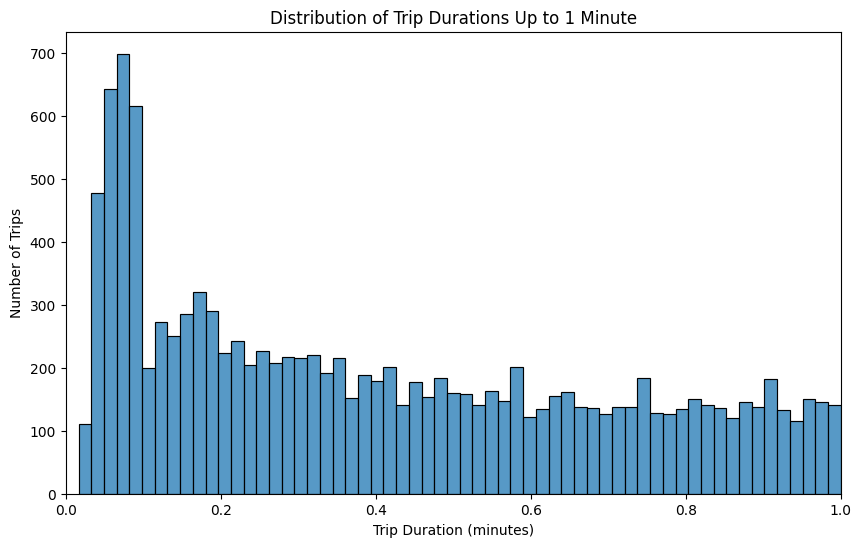

In [44]:
# Filter the DataFrame to include only trips up to 1 mile
trips_up_to_1_mile = project_data_20[project_data_20['trip_distance'] <= 1]

# Create a histogram of trip distances up to 1 mile
plt.figure(figsize=(10, 6))
sns.histplot(trips_up_to_1_mile['trip_distance'], bins=100, kde=False)
plt.title('Distribution of Trip Distances Up to 1 Mile')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Number of Trips')
plt.show()

# Filter the DataFrame to include only trips up to 1 mile
trips_up_to_1_mile = project_data_20[project_data_20['trip_distance'] <= 1]

# Create a scatter plot of trip distance vs total price for trips up to 1 mile
plt.figure(figsize=(10, 6))
sns.scatterplot(data=trips_up_to_1_mile, x='trip_distance', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Distance vs. Total Price for Trips Up to 1 Mile')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Total Price ($)')
plt.show()

# Convert 'trip_duration' to minutes for easier interpretation
project_data_20['trip_duration_minutes'] = project_data_20['trip_duration'] / 60

plt.figure(figsize=(10, 6))
sns.histplot(project_data_20['trip_duration_minutes'], bins=100, kde=False)
plt.title('Distribution of Trip Durations')
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Number of Trips')
plt.show()

# Filter the DataFrame to include only trips up to 1 minute
trips_up_to_1_minute = project_data_20[project_data_20['trip_duration_minutes'] <= 1]

plt.figure(figsize=(10, 6))
sns.histplot(trips_up_to_1_minute['trip_duration_minutes'], bins=60, kde=False)  # Using 60 bins for seconds granularity
plt.title('Distribution of Trip Durations Up to 1 Minute')
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Number of Trips')
plt.xlim(0, 1)  # Limit x-axis to 1 minute for clarity
plt.show()


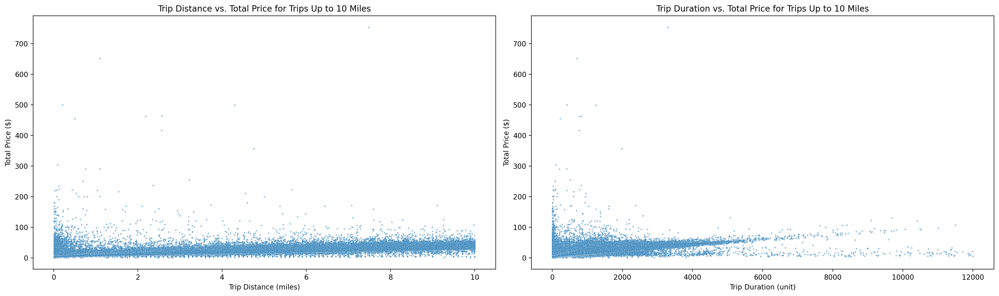

In [45]:
# Filter the DataFrame to include only trips up to 10 mile
trips_up_to_10_miles = project_data_20[project_data_20['trip_distance'] <= 10]

# Set up the matplotlib figure
plt.figure(figsize=(20, 6), dpi=200)

# First subplot: Trip Distance vs. Total Price for trips up to 1 mile
plt.subplot(1, 2, 1)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_distance', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Distance vs. Total Price for Trips Up to 10 Miles')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Total Price ($)')

# Second subplot: Trip Duration vs. Total Price for trips up to 1 mile
plt.subplot(1, 2, 2)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_duration', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Duration vs. Total Price for Trips Up to 10 Miles')
plt.xlabel('Trip Duration (unit)')
plt.ylabel('Total Price ($)')

plt.tight_layout() 
plt.show()


In [46]:
print(f"fare > 150 : {len(project_data_20[project_data_20.fare_amount > 150])}")
print(f"tprice > 150 : {len(project_data_20[project_data_20.total_amount > 150])}")
print(f"fare < 3.3 : {len(project_data_20[project_data_20.fare_amount < 3.3])}")
print(f"tprice < 3.3 : {len(project_data_20[project_data_20.total_amount < 3.3])}")
# Count the number of rows where fare amount is higher than total amount
num_rows_fare_higher_than_total = (project_data_20['fare_amount'] > project_data_20['total_amount']).sum()
print(f"Number of rows where fare is higher than total: {num_rows_fare_higher_than_total}")

fare > 150 : 54
tprice > 150 : 122
fare < 3.3 : 13049
tprice < 3.3 : 82
Number of rows where fare is higher than total: 0


In [47]:
project_data_20[project_data_20['fare_amount'] < 2.5]

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes
2758,2020-01-01 04:19:33,2020-01-01 04:19:55,177,177,3.00,2.00,2.00,22.0,1,0,0,2.00,3-5,0-1 min,0.366667
18596,2020-01-03 01:11:41,2020-01-03 01:18:18,168,69,1.29,0.08,0.38,397.0,1,0,0,0.38,1-2,5-10 min,6.616667
33435,2020-01-04 15:28:57,2020-01-04 15:48:46,168,171,9.62,0.01,6.43,1189.0,0,0,0,6.43,5-10,10-20 min,19.816667
36235,2020-01-04 19:28:05,2020-01-04 19:41:31,213,75,5.40,0.05,0.05,806.0,0,0,0,0.05,5-10,10-20 min,13.433333
61084,2020-01-07 11:50:42,2020-01-07 11:51:17,145,145,3.70,1.00,1.00,35.0,0,0,0,1.00,3-5,0-1 min,0.583333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1658361,2020-12-05 06:54:52,2020-12-05 07:04:36,124,132,5.50,0.01,0.31,584.0,0,0,0,0.31,5-10,5-10 min,9.733333
1673482,2020-12-14 17:28:40,2020-12-14 17:29:01,265,265,0.27,0.49,0.79,21.0,0,1,0,0.79,0-1,0-1 min,0.350000
1678310,2020-12-18 10:01:28,2020-12-18 12:59:49,93,241,20.66,1.00,1.30,10701.0,0,0,0,1.30,20-30,100+ min,178.350000
1679554,2020-12-18 21:12:30,2020-12-18 22:00:58,42,264,7.03,0.05,0.35,2908.0,1,0,0,0.35,5-10,20-50 min,48.466667


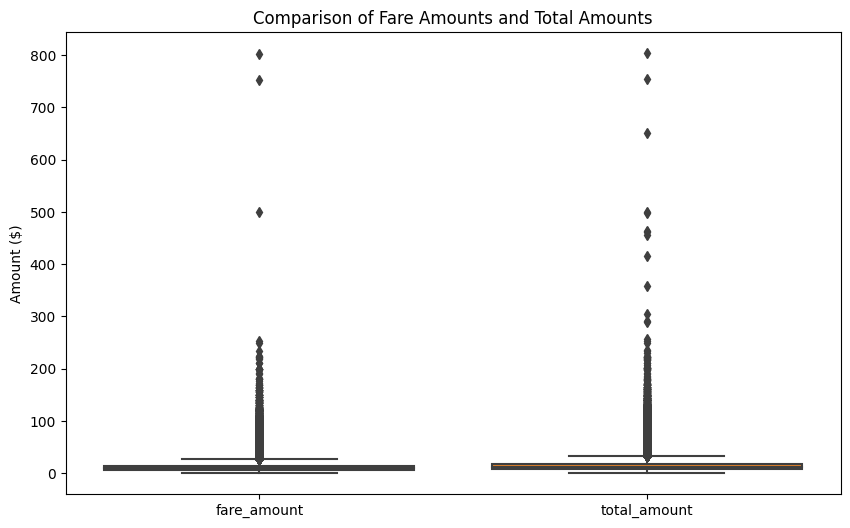

In [48]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=project_data_20[['fare_amount', 'total_amount']])
plt.title('Comparison of Fare Amounts and Total Amounts')
plt.ylabel('Amount ($)')
plt.show()

C:\Users\tomui\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


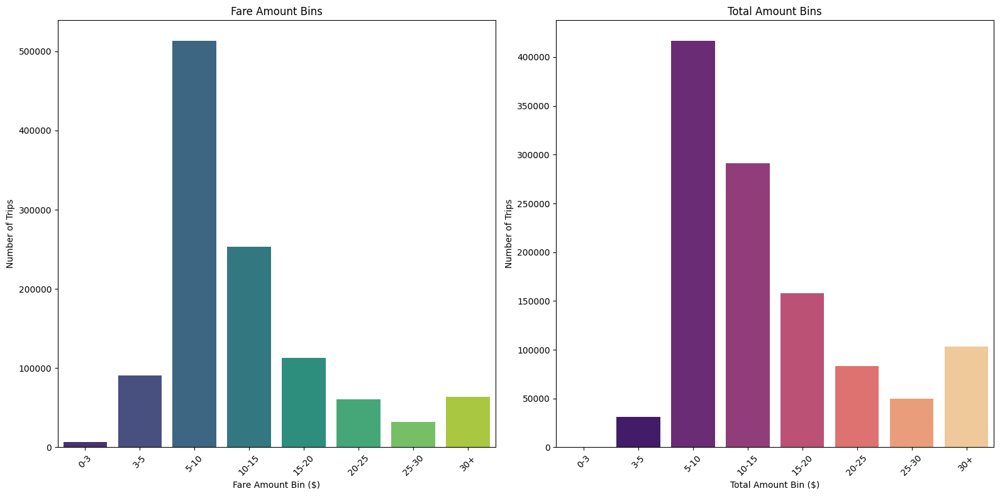

In [49]:
# Defining bins for fares
fare_bins = [0, 3, 5, 10, 15, 20, 25, 30, np.inf]
fare_labels = ['0-3', '3-5', '5-10', '10-15', '15-20', '20-25', '25-30', '30+']

# Defining bins for total amounts
total_bins = [0, 3, 5, 10, 15, 20, 25, 30, np.inf]
total_labels = ['0-3', '3-5', '5-10', '10-15', '15-20', '20-25', '25-30', '30+']

# Bin the fare amount data
project_data_20['fare_bin'] = pd.cut(project_data_20['fare_amount'], bins=fare_bins, labels=fare_labels, right=False)

# Bin the total amount data
project_data_20['total_bin'] = pd.cut(project_data_20['total_amount'], bins=total_bins, labels=total_labels, right=False)

# Set the figure size
plt.figure(figsize=(16, 8))

# Plot for binned fare amounts
plt.subplot(1, 2, 1)
sns.countplot(x='fare_bin', data=project_data_20, palette='viridis')
plt.title('Fare Amount Bins')
plt.xlabel('Fare Amount Bin ($)')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

# Plot for binned total amounts
plt.subplot(1, 2, 2)
sns.countplot(x='total_bin', data=project_data_20, palette='magma')
plt.title('Total Amount Bins')
plt.xlabel('Total Amount Bin ($)')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [50]:
project_data_20.describe()

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,trip_duration_minutes
count,1134497,1134497,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06,1.134497e+06
mean,2020-04-12 01:50:13.717879808,2020-04-12 02:03:25.120062208,1.004477e+02,1.291624e+02,2.954837e+00,1.247094e+01,1.557167e+01,7.914022e+02,2.320332e-01,2.179107e-01,1.857819e-01,1.430309e+01,1.319004e+01
min,2009-01-01 00:08:09,2009-01-01 00:16:57,1.000000e+00,1.000000e+00,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e-02,1.666667e-02
25%,2020-01-29 12:34:25,2020-01-29 12:48:04,4.900000e+01,6.500000e+01,1.050000e+00,6.500000e+00,8.300000e+00,3.760000e+02,0.000000e+00,0.000000e+00,0.000000e+00,7.800000e+00,6.266667e+00
50%,2020-02-25 21:45:41,2020-02-25 21:56:08,7.500000e+01,1.290000e+02,1.790000e+00,9.000000e+00,1.176000e+01,6.130000e+02,0.000000e+00,0.000000e+00,0.000000e+00,1.080000e+01,1.021667e+01
75%,2020-06-15 16:14:23,2020-06-15 16:34:56,1.300000e+02,1.930000e+02,3.330000e+00,1.450000e+01,1.806000e+01,9.800000e+02,0.000000e+00,0.000000e+00,0.000000e+00,1.655000e+01,1.633333e+01
max,2021-01-01 00:03:16,2021-01-01 00:18:10,2.650000e+02,2.650000e+02,3.996000e+01,8.030000e+02,8.038000e+02,1.200000e+04,1.000000e+00,1.000000e+00,1.000000e+00,8.038000e+02,2.000000e+02
std,NaN,NaN,6.683373e+01,7.660644e+01,3.569966e+00,1.079518e+01,1.249473e+01,6.731913e+02,4.221303e-01,4.128265e-01,3.889307e-01,1.159396e+01,1.121985e+01


### Removing Outliers - conclusions
I will remove rows where:
- fare amounts are less then minimum 2.5 fare: 136 rows - it seems that these are or errors, or discount - not suitable for the model
- total_amounts that are more than 150: targeting 122 rows
- trips with duration less than 10 sec. - these seems to be failures - 3568 rows
- trips with duration longer than 7200 sec. (2 h) - 534 rows

In [51]:
print(f"tdur < 10 sec.: {len(project_data_20[project_data_20.trip_duration < 10])}")
project_data_20[project_data_20.trip_duration < 10]

tdur < 10 sec.: 3555


,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes,fare_bin,total_bin
179,2020-01-01 00:43:04,2020-01-01 00:43:07,173,264,0.12,45.0,46.18,3.0,1,0,0,45.3,0-1,0-1 min,0.050000,30+,30+
528,2020-01-01 00:36:42,2020-01-01 00:36:47,41,41,0.01,2.5,3.80,5.0,1,0,0,3.8,0-1,0-1 min,0.083333,0-3,3-5
580,2020-01-01 00:50:00,2020-01-01 00:50:04,97,97,0.05,30.0,36.36,4.0,1,0,0,30.3,0-1,0-1 min,0.066667,30+,30+
665,2020-01-01 00:04:55,2020-01-01 00:05:04,129,129,0.10,30.0,30.30,9.0,1,0,0,30.3,0-1,0-1 min,0.150000,30+,30+
1002,2020-01-01 01:09:39,2020-01-01 01:09:47,223,223,13.50,2.5,3.80,8.0,1,0,0,3.8,10-20,0-1 min,0.133333,0-3,3-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1696613,2020-12-31 15:52:21,2020-12-31 15:52:23,264,264,2.55,13.5,14.30,2.0,0,0,0,14.3,2-3,0-1 min,0.033333,10-15,10-15
1696917,2020-12-31 17:12:49,2020-12-31 17:12:54,116,116,0.01,2.5,4.30,5.0,0,1,0,4.3,0-1,0-1 min,0.083333,0-3,3-5
1697079,2020-12-31 18:21:57,2020-12-31 18:22:00,154,154,0.16,40.0,41.10,3.0,0,1,0,40.3,0-1,0-1 min,0.050000,30+,30+
1697102,2020-12-31 19:22:25,2020-12-31 19:22:29,42,42,0.03,2.5,4.30,4.0,0,1,0,4.3,0-1,0-1 min,0.066667,0-3,3-5


In [52]:
# Removing rows where fare amounts are less than the minimum fare of $2.5
project_data_20 = project_data_20[project_data_20['fare_amount'] >= 2.5]

# Removing rows where total amounts are more than $150
project_data_20 = project_data_20[project_data_20['total_amount'] <= 150]

# Removing trips with duration less than 10 seconds
project_data_20 = project_data_20[project_data_20['trip_duration'] >= 10]

# Removing trips with duration more than 6000 seconds
project_data_20 = project_data_20[project_data_20['trip_duration'] <= 7200]

project_data_20.shape

(1130277, 17)

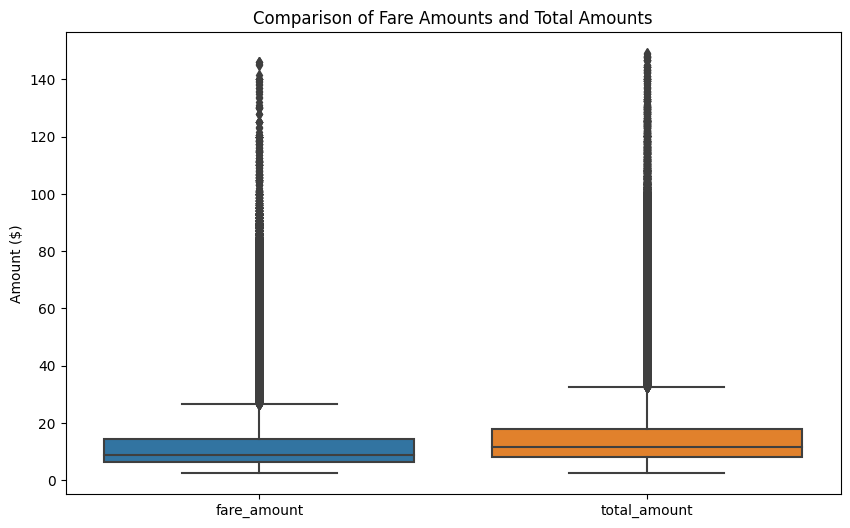

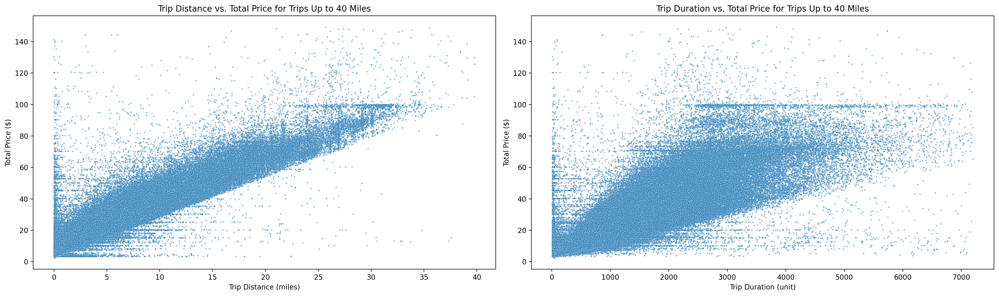

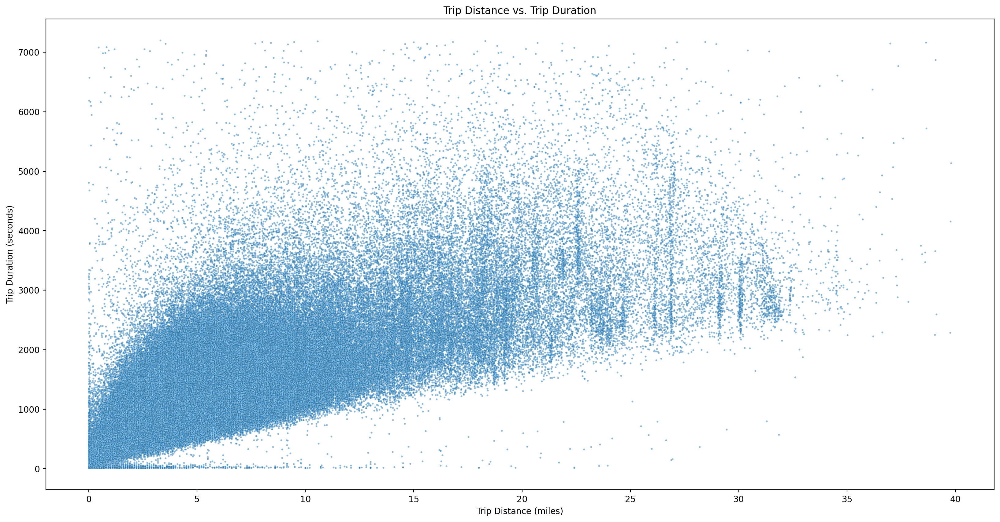

In [53]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=project_data_20[['fare_amount', 'total_amount']])
plt.title('Comparison of Fare Amounts and Total Amounts')
plt.ylabel('Amount ($)')
plt.show()

# Filter the DataFrame to include only trips up to 40 mile
trips_up_to_10_miles = project_data_20[project_data_20['trip_distance'] <= 40]

# Set up the matplotlib figure
plt.figure(figsize=(20, 6), dpi=200)

# First subplot: Trip Distance vs. Total Price for trips up to 40 mile
plt.subplot(1, 2, 1)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_distance', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Distance vs. Total Price for Trips Up to 40 Miles')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Total Price ($)')

# Second subplot: Trip Duration vs. Total Price for trips up to 40 mile
plt.subplot(1, 2, 2)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_duration', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Duration vs. Total Price for Trips Up to 40 Miles')
plt.xlabel('Trip Duration (unit)')
plt.ylabel('Total Price ($)')

plt.tight_layout() 
plt.show()

# Creating a scatter plot for 'trip_distance' vs. 'trip_duration'
plt.figure(figsize=(20, 10), dpi=200)
sns.scatterplot(data=project_data_20, x='trip_distance', y='trip_duration', alpha=0.5, s=5)

plt.title('Trip Distance vs. Trip Duration')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (seconds)')
plt.show()


The figures shows that some taxis have traveled unrealistically long distances in short durations, which could indicate equipment failures or data errors. Let's remove them by calculating max average speed.

In [54]:
# Calculate Average Speed for Each Trip
# Convert 'trip_duration' from seconds to hours
project_data_20['trip_duration_hours'] = project_data_20['trip_duration'] / 3600

# Calculate average speed (mph)
project_data_20['average_speed_mph'] = project_data_20['trip_distance'] / project_data_20['trip_duration_hours']

# Descriptive statistics for average speed
speed_stats = project_data_20['average_speed_mph'].describe()
print(speed_stats)

count    1.130277e+06
mean     1.295116e+01
std      2.514784e+01
min      7.485964e-03
25%      8.820513e+00
50%      1.108651e+01
75%      1.446067e+01
max      8.064000e+03
Name: average_speed_mph, dtype: float64


In [55]:
# Calculate the Interquartile Range (IQR)
IQR = speed_stats['75%'] - speed_stats['25%']

# Define a threshold as the 75th percentile + 3 * IQR
threshold_speed = speed_stats['75%'] + 3 * IQR

print(f"Suggested maximum average speed threshold: {threshold_speed} mph")

Suggested maximum average speed threshold: 31.381158167675025 mph


In [56]:
# Filter out trips with average speeds above the threshold
filtered_data = project_data_20[project_data_20['average_speed_mph'] <= threshold_speed]

print(f"Original number of trips: {project_data_20.shape[0]}")
print(f"Number of trips after filtering: {filtered_data.shape[0]}")

Original number of trips: 1130277
Number of trips after filtering: 1113174


In [57]:
# I'm filtering project data at max average speed 60 mph/hour
project_data_20 = project_data_20[project_data_20['average_speed_mph'] <= 60]
project_data_20.shape

(1129008, 19)

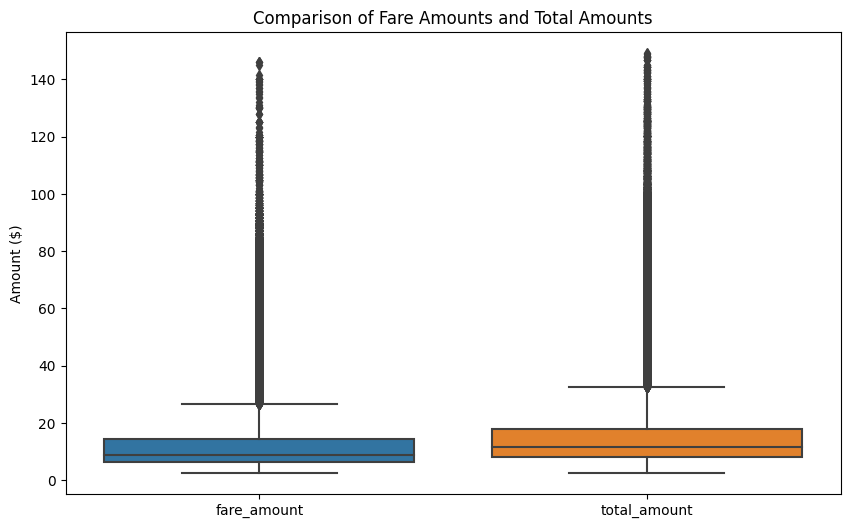

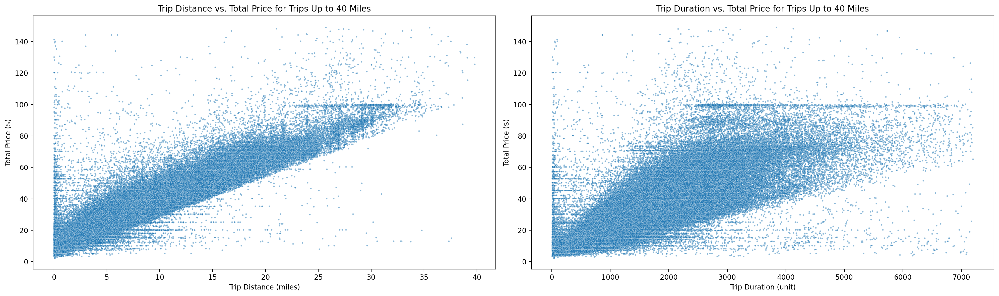

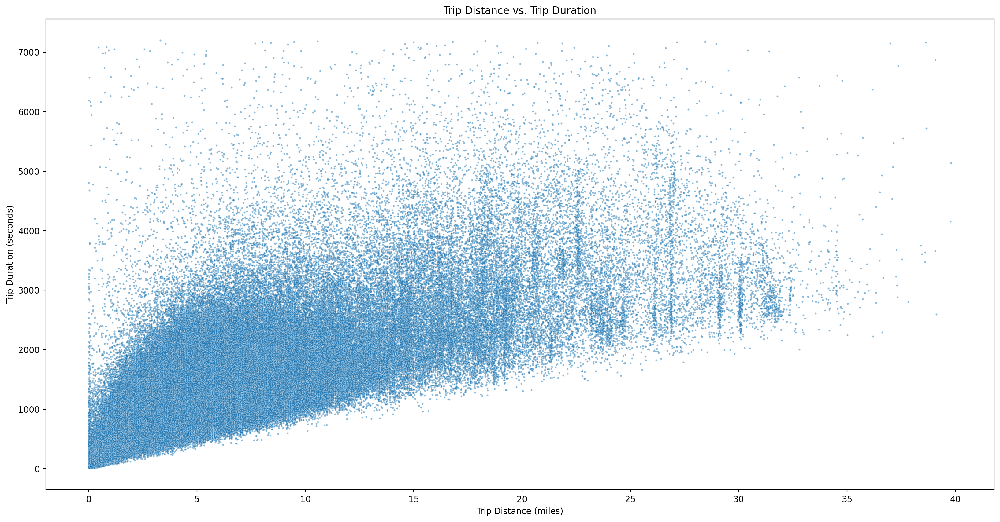

In [58]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=project_data_20[['fare_amount', 'total_amount']])
plt.title('Comparison of Fare Amounts and Total Amounts')
plt.ylabel('Amount ($)')
plt.show()

# Filter the DataFrame to include only trips up to 40 mile
trips_up_to_10_miles = project_data_20[project_data_20['trip_distance'] <= 40]

# Set up the matplotlib figure
plt.figure(figsize=(20, 6), dpi=200)

# First subplot: Trip Distance vs. Total Price for trips up to 40 mile
plt.subplot(1, 2, 1)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_distance', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Distance vs. Total Price for Trips Up to 40 Miles')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Total Price ($)')

# Second subplot: Trip Duration vs. Total Price for trips up to 40 mile
plt.subplot(1, 2, 2)
sns.scatterplot(data=trips_up_to_10_miles, x='trip_duration', y='total_amount', alpha=0.5, s=5)
plt.title('Trip Duration vs. Total Price for Trips Up to 40 Miles')
plt.xlabel('Trip Duration (unit)')
plt.ylabel('Total Price ($)')

plt.tight_layout() 
plt.show()

# Creating a scatter plot for 'trip_distance' vs. 'trip_duration'
plt.figure(figsize=(20, 10), dpi=200)
sns.scatterplot(data=project_data_20, x='trip_distance', y='trip_duration', alpha=0.5, s=5)

plt.title('Trip Distance vs. Trip Duration')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (seconds)')
plt.show()

I will search for some unrealistic data, that may be caused by equipment errors, therefore I will try some my presumptions.

In [59]:
# Filter out trips with average speeds below the 2 miles/hour - looks reasonable data
project_data_20[project_data_20['average_speed_mph'] < 2]

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes,fare_bin,total_bin,trip_duration_hours,average_speed_mph
1015,2020-01-01 01:29:40,2020-01-01 01:36:26,255,255,0.05,65.0,65.30,406.0,1,0,0,65.3,0-1,5-10 min,6.766667,30+,30+,0.112778,0.443350
1116,2020-01-01 01:58:35,2020-01-01 02:02:16,193,193,0.10,4.0,5.30,221.0,1,0,0,5.3,0-1,2-5 min,3.683333,3-5,5-10,0.061389,1.628959
1540,2020-01-01 02:53:59,2020-01-01 02:55:29,256,264,0.01,131.0,141.30,90.0,1,0,0,131.3,0-1,1-2 min,1.500000,30+,30+,0.025000,0.400000
1664,2020-01-01 02:17:04,2020-01-01 02:17:54,189,189,0.01,20.0,24.36,50.0,1,0,0,20.3,0-1,0-1 min,0.833333,20-25,20-25,0.013889,0.720000
1841,2020-01-01 02:40:54,2020-01-01 02:41:38,82,82,0.01,2.5,3.80,44.0,1,0,0,3.8,0-1,0-1 min,0.733333,0-3,3-5,0.012222,0.818182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1694511,2020-12-30 07:46:20,2020-12-30 07:46:59,74,74,0.01,2.5,3.30,39.0,0,0,0,3.3,0-1,0-1 min,0.650000,0-3,3-5,0.010833,0.923077
1695342,2020-12-30 16:42:05,2020-12-30 16:42:43,95,95,0.02,2.5,4.30,38.0,0,1,0,4.3,0-1,0-1 min,0.633333,0-3,3-5,0.010556,1.894737
1695593,2020-12-30 19:57:39,2020-12-30 20:19:31,244,244,0.50,13.5,15.30,1312.0,0,1,0,15.3,0-1,20-50 min,21.866667,10-15,15-20,0.364444,1.371951
1696827,2020-12-31 16:05:49,2020-12-31 16:11:17,265,265,0.04,30.0,30.30,328.0,0,1,0,30.3,0-1,5-10 min,5.466667,30+,30+,0.091111,0.439024


In [60]:
# Trips among zones with very short distances - looks like errors
project_data_20[((project_data_20['PULocationID'] != project_data_20['DOLocationID']) & (project_data_20['trip_distance'] < 0.1))]

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes,fare_bin,total_bin,trip_duration_hours,average_speed_mph
386,2020-01-01 00:51:50,2020-01-01 00:52:28,181,264,0.03,81.0,85.30,38.0,1,0,0,81.3,0-1,0-1 min,0.633333,30+,30+,0.010556,2.842105
1090,2020-01-01 01:50:22,2020-01-01 01:50:46,225,17,0.03,2.5,3.80,24.0,1,0,0,3.8,0-1,0-1 min,0.400000,0-3,3-5,0.006667,4.500000
1540,2020-01-01 02:53:59,2020-01-01 02:55:29,256,264,0.01,131.0,141.30,90.0,1,0,0,131.3,0-1,1-2 min,1.500000,30+,30+,0.025000,0.400000
3548,2020-01-01 07:02:25,2020-01-01 07:04:25,37,264,0.01,20.0,20.30,120.0,0,0,0,20.3,0-1,2-5 min,2.000000,20-25,20-25,0.033333,0.300000
4954,2020-01-01 13:28:13,2020-01-01 13:31:52,7,179,0.04,4.0,4.80,219.0,0,0,0,4.8,0-1,2-5 min,3.650000,3-5,3-5,0.060833,0.657534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1690723,2020-12-27 00:09:22,2020-12-27 00:09:55,146,7,0.08,2.5,3.80,33.0,1,0,0,3.8,0-1,0-1 min,0.550000,0-3,3-5,0.009167,8.727273
1691591,2020-12-27 23:12:48,2020-12-27 23:18:10,166,41,0.03,5.0,6.30,322.0,1,0,0,6.3,0-1,5-10 min,5.366667,5-10,5-10,0.089444,0.335404
1693769,2020-12-29 15:40:58,2020-12-29 15:41:26,41,42,0.03,2.5,3.30,28.0,0,0,0,3.3,0-1,0-1 min,0.466667,0-3,3-5,0.007778,3.857143
1693893,2020-12-29 16:46:04,2020-12-29 16:47:08,41,42,0.09,3.0,4.80,64.0,0,1,0,4.8,0-1,1-2 min,1.066667,3-5,3-5,0.017778,5.062500


In [61]:
# Trips among zones with very short distances - remove 1041 rows - I guess - errors
project_data_20 = project_data_20[~((project_data_20['PULocationID'] != project_data_20['DOLocationID']) & (project_data_20['trip_distance'] < 0.1))]

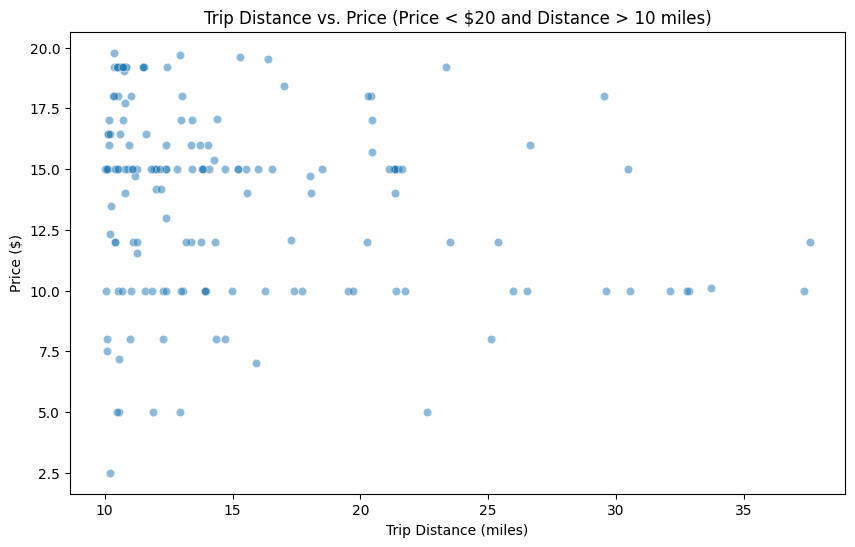

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes,fare_bin,total_bin,trip_duration_hours,average_speed_mph
33727,2020-01-04 15:28:31,2020-01-04 16:00:18,7,132,13.97,10.00,10.30,1907.0,0,0,0,10.30,10-20,20-50 min,31.783333,10-15,10-15,0.529722,26.372313
48890,2020-01-06 07:36:45,2020-01-06 07:47:23,210,150,10.10,7.50,8.30,638.0,0,0,0,8.30,10-20,10-20 min,10.633333,5-10,5-10,0.177222,56.990596
72093,2020-01-08 12:38:47,2020-01-08 13:09:37,196,56,11.28,11.56,12.36,1850.0,0,0,0,12.36,10-20,20-50 min,30.833333,10-15,10-15,0.513889,21.950270
86578,2020-01-09 16:41:12,2020-01-09 17:57:38,134,161,14.72,15.00,18.05,4586.0,0,1,1,18.05,10-20,50-100 min,76.433333,15-20,15-20,1.273889,11.555168
105469,2020-01-11 09:03:04,2020-01-11 10:50:19,97,97,33.73,10.09,12.84,6435.0,0,0,1,12.84,30+,100+ min,107.250000,10-15,10-15,1.787500,18.869930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1688855,2020-12-24 21:49:53,2020-12-24 22:30:23,78,213,10.73,17.00,17.30,2430.0,1,0,0,17.30,10-20,20-50 min,40.500000,15-20,15-20,0.675000,15.896296
1691600,2020-12-27 23:49:49,2020-12-28 01:05:26,74,75,13.43,17.00,17.30,4537.0,1,0,0,17.30,10-20,50-100 min,75.616667,15-20,15-20,1.260278,10.656381
1693921,2020-12-29 16:33:51,2020-12-29 18:09:30,42,132,26.50,10.00,10.30,5739.0,0,1,0,10.30,20-30,50-100 min,95.650000,10-15,10-15,1.594167,16.623105
1694793,2020-12-30 11:26:39,2020-12-30 11:58:23,127,164,11.27,12.00,15.05,1904.0,0,0,1,15.05,10-20,20-50 min,31.733333,10-15,15-20,0.528889,21.308824


In [62]:
# Create a scatter plot for trip distance versus price, focusing specifically on trips where the price is less than $20 and the distance is more than 10 miles
filtered_trips = project_data_20[(project_data_20['fare_amount'] < 20) & (project_data_20['trip_distance'] > 10)]
# Create a scatter plot for the filtered data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_trips, x='trip_distance', y='fare_amount', alpha=0.5)
plt.title('Trip Distance vs. Price (Price < $20 and Distance > 10 miles)')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Price ($)')
plt.show()
filtered_trips

In [63]:
significant_distance_threshold = 5

# Filter out trips where pickup and dropoff locations are the same but the trip distance is significantly non-zero - the data looks reasonably
filtered_data = project_data_20[((project_data_20['PULocationID'] == project_data_20['DOLocationID']) & (project_data_20['trip_distance'] > significant_distance_threshold))]
filtered_data


,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,distance_bin,time_bin,trip_duration_minutes,fare_bin,total_bin,trip_duration_hours,average_speed_mph
385,2020-01-01 00:11:35,2020-01-01 00:39:51,264,264,6.80,26.5,27.80,1696.0,1,0,0,27.80,5-10,20-50 min,28.266667,25-30,25-30,0.471111,14.433962
632,2020-01-01 00:53:12,2020-01-01 01:22:10,244,244,5.82,23.5,24.80,1738.0,1,0,0,24.80,5-10,20-50 min,28.966667,20-25,20-25,0.482778,12.055236
1998,2020-01-01 02:22:12,2020-01-01 02:54:04,255,255,6.46,24.0,25.30,1912.0,1,0,0,25.30,5-10,20-50 min,31.866667,20-25,25-30,0.531111,12.163180
3407,2020-01-01 06:08:46,2020-01-01 06:33:51,265,265,13.23,70.0,71.80,1505.0,0,0,0,70.80,10-20,20-50 min,25.083333,30+,30+,0.418056,31.646512
3839,2020-01-01 08:11:52,2020-01-01 09:15:59,55,55,12.17,45.0,45.80,3847.0,0,0,0,45.80,10-20,50-100 min,64.116667,30+,30+,1.068611,11.388615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1696379,2020-12-31 13:54:31,2020-12-31 15:43:43,25,25,6.17,61.0,64.55,6552.0,0,0,0,61.80,5-10,100+ min,109.200000,30+,30+,1.820000,3.390110
1696407,2020-12-31 13:44:03,2020-12-31 15:02:08,7,7,11.79,56.5,63.42,4685.0,0,0,0,63.42,10-20,50-100 min,78.083333,30+,30+,1.301389,9.059552
1696466,2020-12-31 13:46:50,2020-12-31 14:59:06,243,243,6.47,43.5,47.05,4336.0,0,0,0,44.30,5-10,50-100 min,72.266667,30+,30+,1.204444,5.371771
1696677,2020-12-31 15:27:54,2020-12-31 16:04:29,130,130,5.20,24.5,25.30,2195.0,0,0,0,25.30,5-10,20-50 min,36.583333,20-25,25-30,0.609722,8.528474


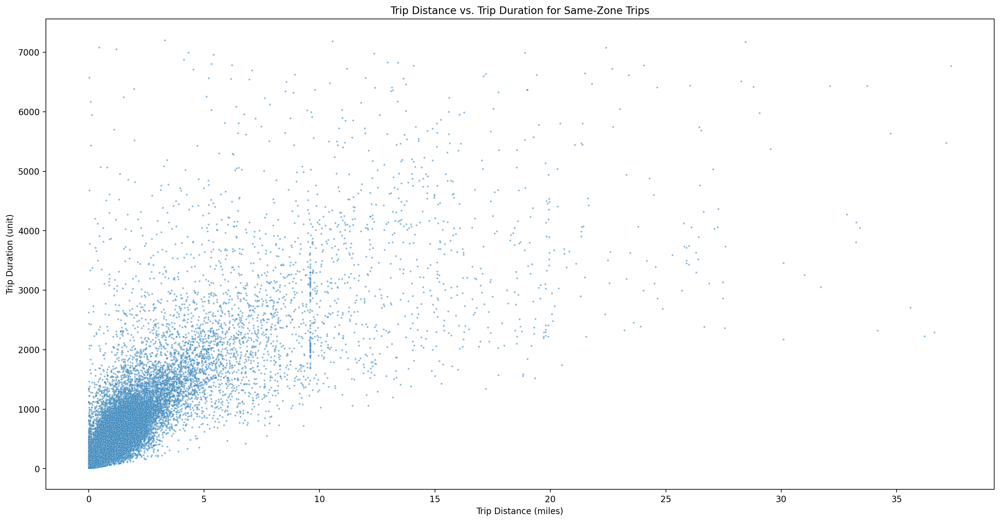

In [64]:
# Filter the DataFrame to include only trips within the same zone
same_zone_trips = project_data_20[project_data_20['PULocationID'] == project_data_20['DOLocationID']]

plt.figure(figsize=(20,10), dpi=200)
sns.scatterplot(data=same_zone_trips, x='trip_distance', y='trip_duration', alpha=0.5, s= 5)

plt.title('Trip Distance vs. Trip Duration for Same-Zone Trips')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (unit)')
plt.show()

## After Cleanup - Checking Correlations Again

In [65]:
project_data_20.columns

Index(['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID',
       'DOLocationID', 'trip_distance', 'fare_amount', 'total_amount',
       'trip_duration', 'night', 'peak_hour', 'congestion',
       'amount_without_tip', 'distance_bin', 'time_bin',
       'trip_duration_minutes', 'fare_bin', 'total_bin', 'trip_duration_hours',
       'average_speed_mph'],
      dtype='object')

In [66]:
project_data_20_for_correlations = project_data_20[['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID',
       'DOLocationID', 'trip_distance', 'fare_amount', 'total_amount',
       'trip_duration', 'night', 'peak_hour', 'congestion',
       'amount_without_tip', 'average_speed_mph']]
corr = project_data_20_for_correlations.corr()
corr

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip,average_speed_mph
lpep_pickup_datetime,1.000000,1.000000,-0.041989,0.000414,0.081599,0.086697,0.084679,0.083724,-0.119519,0.000387,0.036956,0.086306,0.039985
lpep_dropoff_datetime,1.000000,1.000000,-0.041982,0.000423,0.081656,0.086759,0.084740,0.083795,-0.119525,0.000389,0.036970,0.086368,0.039999
PULocationID,-0.041989,-0.041982,1.000000,0.149699,0.128570,0.123072,0.117803,0.092231,0.050631,0.000309,-0.022528,0.118077,0.134404
DOLocationID,0.000414,0.000423,0.149699,1.000000,0.112629,0.114957,0.151241,0.116166,-0.003577,-0.001678,0.344417,0.141163,0.113769
trip_distance,0.081599,0.081656,0.128570,0.112629,1.000000,0.959607,0.941870,0.812481,0.000697,-0.034946,0.165267,0.956946,0.621565
fare_amount,0.086697,0.086759,0.123072,0.114957,0.959607,1.000000,0.976577,0.886529,-0.029959,-0.018564,0.174355,0.992094,0.499327
total_amount,0.084679,0.084740,0.117803,0.151241,0.941870,0.976577,1.000000,0.865298,-0.026579,0.012281,0.286879,0.988039,0.507086
trip_duration,0.083724,0.083795,0.092231,0.116166,0.812481,0.886529,0.865298,1.000000,-0.090455,0.023385,0.205228,0.877366,0.204703
night,-0.119519,-0.119525,0.050631,-0.003577,0.000697,-0.029959,-0.026579,-0.090455,1.000000,-0.290075,-0.054592,-0.027412,0.164296
peak_hour,0.000387,0.000389,0.000309,-0.001678,-0.034946,-0.018564,0.012281,0.023385,-0.290075,1.000000,-0.011170,0.009192,-0.113726


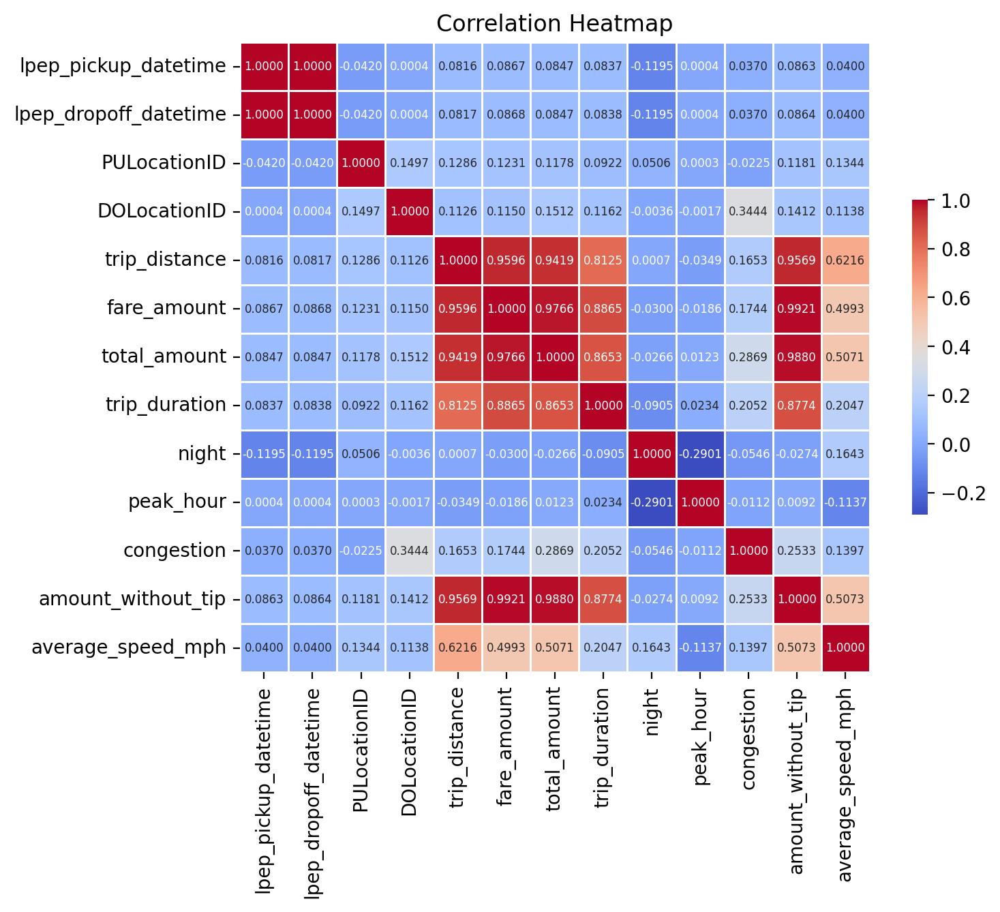

In [67]:
plt.figure(figsize=(8, 6), dpi=200)
sns.heatmap(corr, annot=True, fmt=".4f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"size": 6})
plt.title('Correlation Heatmap')
plt.show()

The correlation between trip duration & distance and fare & total amount, has shown significant improvement. Let's examine how removing trips that involve substantial waiting times and no movement, particularly those covering short distances, might further enhance these correlations - the answer is, that correlations do not changes or even worsenes

In [68]:
cleaned_data = project_data_20[(project_data_20['average_speed_mph'] >= 1) & (project_data_20['trip_distance'] > 0.02)]
# cleaned_data = project_data_20[project_data_20['average_speed_mph'] >= 2]
# cleaned_data = project_data_20[(project_data_20['average_speed_mph'] >= 10) & (project_data_20['trip_distance'] > 4)]
len(cleaned_data)


1126282

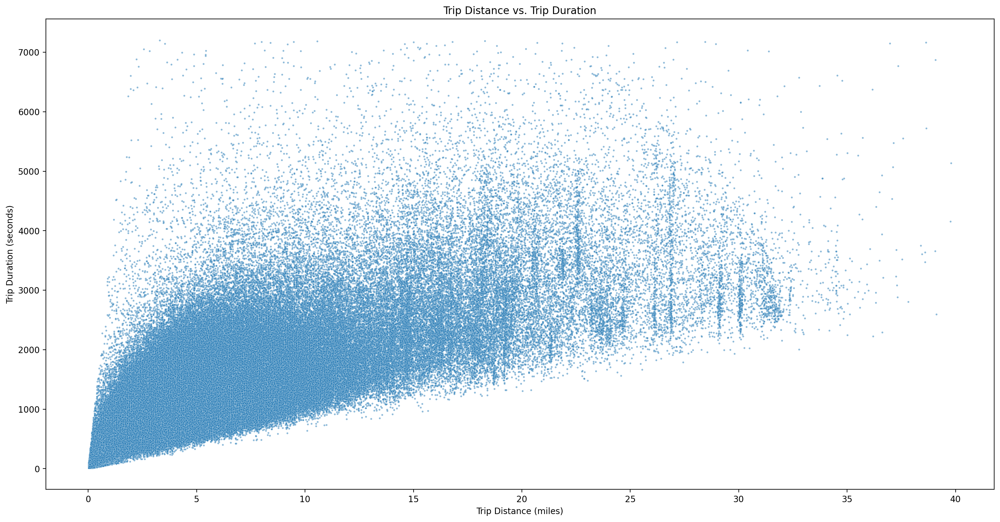

In [69]:
# Creating a scatter plot for 'trip_distance' vs. 'trip_duration'
plt.figure(figsize=(20, 10), dpi=200)
sns.scatterplot(data=cleaned_data, x='trip_distance', y='trip_duration', alpha=0.5, s=5)

plt.title('Trip Distance vs. Trip Duration')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Trip Duration (seconds)')
plt.show()

In [70]:
project_data_20_for_correlations = cleaned_data[['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID',
       'DOLocationID', 'trip_distance', 'trip_duration', 'fare_amount',
       'total_amount']]
project_data_20_for_correlations.corr()

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,trip_duration,fare_amount,total_amount
lpep_pickup_datetime,1.000000,1.000000,-0.042069,0.000540,0.081950,0.084293,0.087054,0.085028
lpep_dropoff_datetime,1.000000,1.000000,-0.042062,0.000548,0.082007,0.084363,0.087117,0.085089
PULocationID,-0.042069,-0.042062,1.000000,0.148402,0.128947,0.092639,0.123331,0.118053
DOLocationID,0.000540,0.000548,0.148402,1.000000,0.112447,0.116137,0.114916,0.151223
trip_distance,0.081950,0.082007,0.128947,0.112447,1.000000,0.814103,0.961047,0.942992
trip_duration,0.084293,0.084363,0.092639,0.116137,0.814103,1.000000,0.889038,0.867525
fare_amount,0.087054,0.087117,0.123331,0.114916,0.961047,0.889038,1.000000,0.976561
total_amount,0.085028,0.085089,0.118053,0.151223,0.942992,0.867525,0.976561,1.000000


## Saving data

In [71]:
project_data_20.columns

Index(['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID',
       'DOLocationID', 'trip_distance', 'fare_amount', 'total_amount',
       'trip_duration', 'night', 'peak_hour', 'congestion',
       'amount_without_tip', 'distance_bin', 'time_bin',
       'trip_duration_minutes', 'fare_bin', 'total_bin', 'trip_duration_hours',
       'average_speed_mph'],
      dtype='object')

In [72]:
# Removing temparary columns that were created for visualisations
project_data_20 = project_data_20.drop(['distance_bin', 'time_bin', 'trip_duration_minutes',
       'fare_bin', 'total_bin', 'trip_duration_hours', 'average_speed_mph'], axis=1)

In [73]:
print(project_data_20.shape)
project_data_20.head(2)

(1128355, 12)


,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount,total_amount,trip_duration,night,peak_hour,congestion,amount_without_tip
1,2020-01-01 00:45:58,2020-01-01 00:56:39,66,65,1.28,20.0,24.36,641.0,1,0,0,20.3
2,2020-01-01 00:41:38,2020-01-01 00:52:49,181,228,2.47,10.5,15.34,671.0,1,0,0,11.8


In [74]:
# After cleanup of the data I've lost 
print(f"Rows lost after cleanup: {initial_rows - project_data_20.shape[0]}")
print(f"Percent: {100 * (initial_rows - project_data_20.shape[0]) / initial_rows}%")

Rows lost after cleanup: 605696
Percent: 34.92953782789549%


In [75]:
project_data_20.to_csv('cleaned_project_data_20.csv', index=False)